In [1]:
pip install pygal

Note: you may need to restart the kernel to use updated packages.


# IMPORTING THE ESSENTIAL LIBRARIES 📚 

In [2]:
import re  # For playing with text patterns
import datetime  # Handling dates and times
import numpy as np  # Rocking with numerical operations
import pandas as pd  # Crunching data with pandas
import matplotlib.pyplot as plt  # Plotting cool graphs
import seaborn as sns  # Making our plots even prettier
from wordcloud import WordCloud, STOPWORDS  # Generating awesome word clouds
import emoji  # Dealing with emojis 😃🎉
import itertools  # Mixing stuff up with iterators
from collections import Counter  # Counting stuff
import warnings  # Ignoring those pesky warnings
warnings.filterwarnings('ignore')  # Shh... quiet now!

# Magic command for inline plotting 🎩✨
%matplotlib inline

C:\Users\vidhu\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


#  PREPARATION AND LOADING DATA 💾

In [3]:
 import re
import pandas as pd

def raw_to_df(file, key):
    '''Converts eda_data text file into a Data Frame'''
    
    split_formats = {
        '12hr': '\d{1,2}/\d{1,2}/\d{2,4},\s\d{1,2}:\d{2}\s[APap][mM]\s-\s',
        '24hr': '\d{1,2}/\d{1,2}/\d{2,4},\s\d{1,2}:\d{2}\s-\s',
        'custom': ''
    }
    datetime_formats = {
        '12hr': '%d/%m/%Y, %I:%M %p - ',
        '24hr': '%d/%m/%Y, %H:%M - ',
        'custom': ''
    }
    
    with open(file, 'r', encoding='utf-8') as raw_data:
        raw_string = ' '.join(raw_data.read().split('\n'))
        user_msg = re.split(split_formats[key], raw_string)[1:]
        date_time = re.findall(split_formats[key], raw_string)
        
        df = pd.DataFrame({'date_time': date_time, 'user_msg': user_msg})
        
    df['date_time'] = pd.to_datetime(df['date_time'], format=datetime_formats[key])
    
    usernames = []
    msgs = []
    for msg in df['user_msg']:
        split_msg = re.split('([\w\W]+?):\s', msg)
        if len(split_msg) > 1:
            usernames.append(split_msg[1])
            msgs.append(split_msg[2])
        else:
            usernames.append("group_notification")
            msgs.append(split_msg[0])

    df['user'] = usernames
    df['message'] = msgs

    df.drop('user_msg', axis=1, inplace=True)
    
    return df

df = raw_to_df('edited_chats.txt', '12hr')
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11010 entries, 0 to 11009
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  11010 non-null  datetime64[ns]
 1   user       11010 non-null  object        
 2   message    11010 non-null  object        
dtypes: datetime64[ns](1), object(2)
memory usage: 258.2+ KB


In [4]:
# The dataset contains 3 rows, and 13655 respective entries
df.head(10)

,date_time,user,message
0,2020-01-26 16:19:00,group_notification,Messages and calls are end-to-end encrypted. N...
1,2020-01-24 20:25:00,group_notification,"Samay Raina created group ""CODERS👨‍💻👩‍💻🖥💻"""
2,2020-01-26 16:19:00,group_notification,You joined using this group's invite link
3,2020-01-26 16:20:00,group_notification,+91 99871 38558 joined using this group's invi...
4,2020-01-26 16:20:00,group_notification,+91 91680 38866 joined using this group's invi...
5,2020-01-26 16:22:00,group_notification,+91 72762 35231 joined using this group's invi...
6,2020-01-26 16:22:00,group_notification,+91 88392 06534 joined using this group's invi...
7,2020-01-26 16:23:00,group_notification,+91 98709 38217 joined using this group's invi...
8,2020-01-26 16:23:00,group_notification,+91 98702 02065 joined using this group's invi...
9,2020-01-26 16:23:00,group_notification,+91 91370 44426 joined using this group's invi...


In [5]:
df.sample(10)

,date_time,user,message
9039,2020-07-19 12:37:00,Mudit Verma,Haan because you must've not had the stars bac...
10752,2020-08-26 13:22:00,Samay Raina,thnx for this
8206,2020-06-29 11:15:00,"Rishab Saini (TSEC CS, TE)",national leve codethon
10221,2020-08-21 23:12:00,Mudit Verma,I have attended sir's talks and he has really ...
5639,2020-05-02 17:20:00,Sanyog Sharma,SE
3638,2020-03-21 15:34:00,Sanyog Sharma,use long loong
9438,2020-08-06 23:23:00,+91 88889 97733,Even kajli Ma’am k liye suna tha but she’s nic...
2500,2020-02-29 22:54:00,Rupali Jain,Mera chalu hai. Bol.
3233,2020-03-15 23:05:00,Samay Raina,🤣
4039,2020-03-26 12:10:00,Samay Raina,semi colon after if?


In [6]:
empty_messages_count = df[df['message'] == ""].shape[0]
print(empty_messages_count)


477


In [7]:
df['day'] = df['date_time'].dt.strftime('%a')
df['month'] = df['date_time'].dt.strftime('%b')
df['year'] = df['date_time'].dt.year
df['date'] = df['date_time'].dt.date


In [8]:
df

,date_time,user,message,day,month,year,date
0,2020-01-26 16:19:00,group_notification,Messages and calls are end-to-end encrypted. N...,Sun,Jan,2020,2020-01-26
1,2020-01-24 20:25:00,group_notification,"Samay Raina created group ""CODERS👨‍💻👩‍💻🖥💻""",Fri,Jan,2020,2020-01-24
2,2020-01-26 16:19:00,group_notification,You joined using this group's invite link,Sun,Jan,2020,2020-01-26
3,2020-01-26 16:20:00,group_notification,+91 99871 38558 joined using this group's invi...,Sun,Jan,2020,2020-01-26
4,2020-01-26 16:20:00,group_notification,+91 91680 38866 joined using this group's invi...,Sun,Jan,2020,2020-01-26
...,...,...,...,...,...,...,...
11005,2020-08-30 19:24:00,+91 84335 18102,Ranveer😍,Sun,Aug,2020,2020-08-30
11006,2020-08-30 19:28:00,Anjali Kapoor,If you are interested you can also watch plane...,Sun,Aug,2020,2020-08-30
11007,2020-08-30 20:02:00,Samay Raina,ohk nyc👍,Sun,Aug,2020,2020-08-30
11008,2020-08-30 20:28:00,Mudit Verma,As it is purely tech related...,Sun,Aug,2020,2020-08-30


## 1.OVERALL FREQUENCY OF THE GROUP

In [9]:
df1 = df.copy()
df1['message_count'] = 1

if 'year' in df1.columns:
    df1.drop(columns='year', inplace=True)

df1 = df1.groupby('date')['message_count'].sum().reset_index()
print(df1)


           date  message_count
0    2020-01-24              1
1    2020-01-26            105
2    2020-01-27             90
3    2020-01-28            126
4    2020-01-29            118
..          ...            ...
206  2020-08-26            299
207  2020-08-27            124
208  2020-08-28             19
209  2020-08-29              1
210  2020-08-30             23

[211 rows x 2 columns]


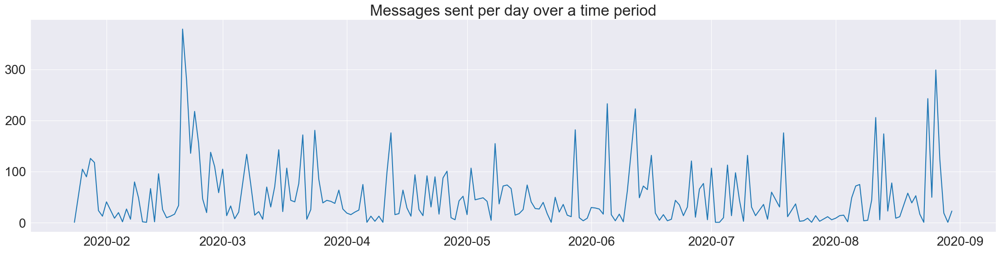

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set default style using Seaborn
sns.set_style("darkgrid")

# Adjust font size and figure size
plt.rcParams['font.size'] = 20
plt.rcParams['figure.figsize'] = (27, 6)

# Plotting messages sent per day over a time period
plt.plot(df1['date'], df1['message_count'])
plt.title('Messages sent per day over a time period')

# Saving the plot
plt.savefig('msg_plots.svg', format='svg')
plt.show()


## 2. CALCULATE TOP 10 MOST ACTIVE DAYS

In [11]:
top10days = df1.sort_values(by="message_count", ascending=False).head(10)
top10days.reset_index(drop=True, inplace=True)
print(top10days)


         date  message_count
0  2020-02-20            379
1  2020-08-26            299
2  2020-02-21            278
3  2020-08-24            243
4  2020-06-05            233
5  2020-06-12            223
6  2020-02-23            218
7  2020-08-11            206
8  2020-05-28            182
9  2020-03-24            181


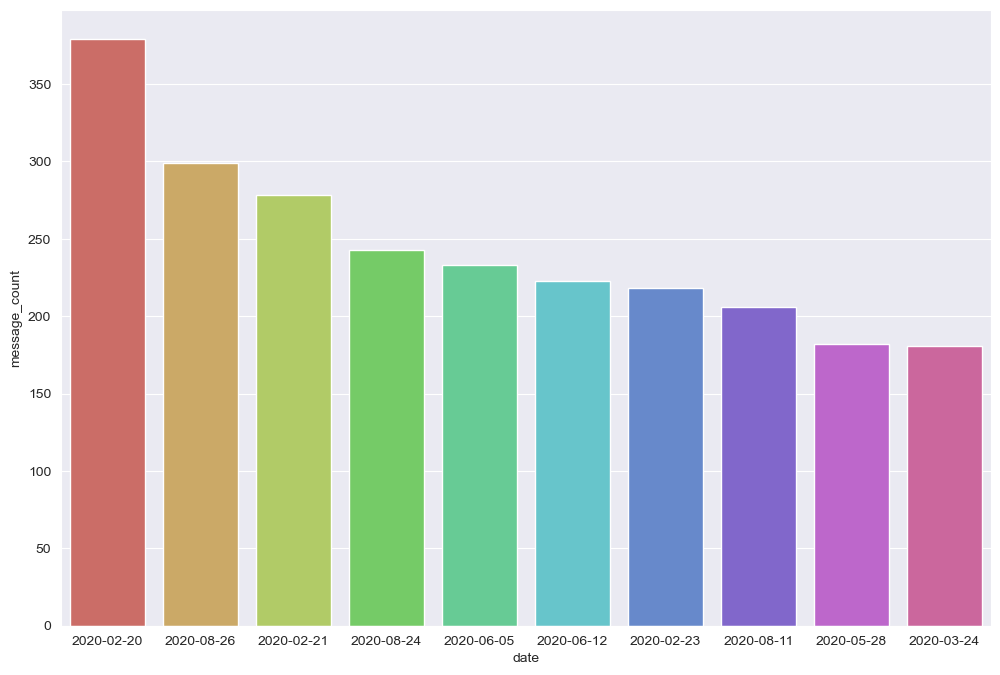

In [12]:
 import seaborn as sns
import matplotlib.pyplot as plt

# Set default style using Seaborn
sns.set_style("darkgrid")

# Adjust font size and figure size
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = (12, 8)

# Create a bar plot for top 10 days
sns.barplot(x='date', y='message_count', data=top10days, palette="hls")

# Save the plot
plt.savefig('top10_days.svg', format='svg')
plt.show()


In [13]:
total_users = len(df['user'].unique())
total_ghosts = 237 - total_users + 1  # Assuming 237 is the total number of group members including one admin

print(f"Total number of people who have sent at least one message in the group: {total_users - 1}")
print(f"Number of people who haven't sent even a single message in the group: {total_ghosts}")


Total number of people who have sent at least one message in the group: 136
Number of people who haven't sent even a single message in the group: 101


## 3. TOP 10 ACTIVE USERS

In [14]:
# Make a copy of the DataFrame
df2 = df.copy()

# Remove messages from "group_notification"
df2 = df2[df2['user'] != "group_notification"]

# Group by user and count the number of messages, then sort in descending order
top10df = df2.groupby("user")["message"].count().sort_values(ascending=False)

# Select the top 10 active users and reset the index
top10df = top10df.head(10).reset_index()

# Display the DataFrame of top 10 active users
print(top10df)


            user  message
0    Samay Raina     1916
1   Janvi Rathod     1634
2  Anjali Kapoor     1072
3  Sanyog Sharma      768
4    Rupali Jain      660
5    Mudit Verma      649
6  shivika malik      565
7     Manvi Jain      297
8  Mithun Kapoor      248
9  Vikram Nandal      199


In [15]:
# Generate initials for the top 10 active users
top10df['initials'] = ''
for i in range(10):
    initials = top10df['user'][i].split()[0][0] + top10df['user'][i].split()[1][0]
    top10df.at[i, 'initials'] = initials

# Display the DataFrame with initials
print(top10df)

            user  message initials
0    Samay Raina     1916       SR
1   Janvi Rathod     1634       JR
2  Anjali Kapoor     1072       AK
3  Sanyog Sharma      768       SS
4    Rupali Jain      660       RJ
5    Mudit Verma      649       MV
6  shivika malik      565       sm
7     Manvi Jain      297       MJ
8  Mithun Kapoor      248       MK
9  Vikram Nandal      199       VN


In [16]:
import matplotlib.pyplot as plt

# Adjust font size, figure size, and figure face color for better readability
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (9, 5)
plt.rcParams['figure.facecolor'] = '#00000000'

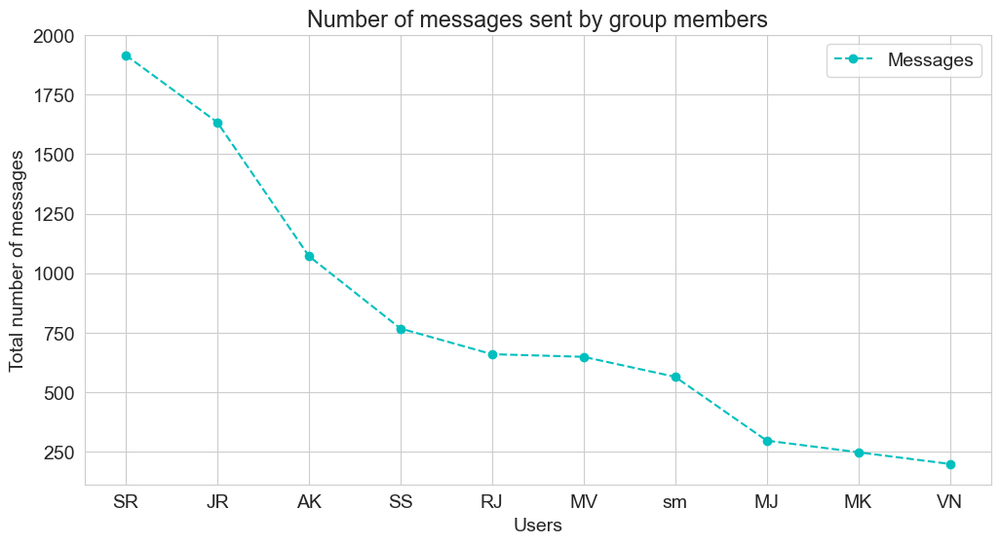

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# Improving default styles using Seaborn
sns.set_style("whitegrid")

# Increasing the figure size
plt.figure(figsize=(12, 6))

# Plotting the line graph
plt.plot(top10df['initials'], top10df['message'], 'o--c')

# Labels and Title
plt.xlabel('Users')
plt.ylabel('Total number of messages')
plt.title("Number of messages sent by group members")
plt.legend(['Messages'])

# Saving the plot
plt.savefig('msg_plots.svg', format='svg')
plt.show()


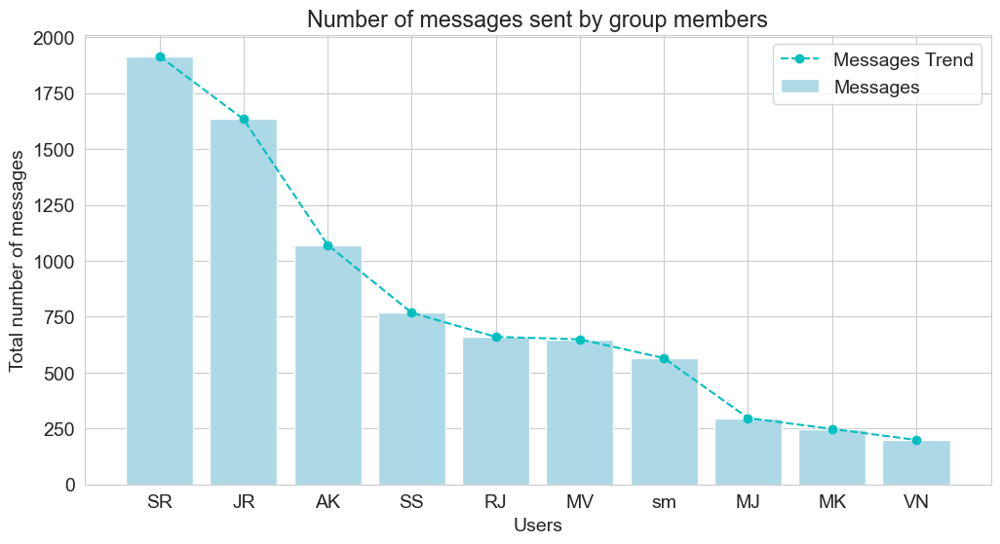

In [18]:
# Improving default styles using Seaborn
sns.set_style("whitegrid")

# Setting the figure size
plt.figure(figsize=(12, 6))

# Plotting the bar chart
plt.bar(top10df['initials'], top10df['message'], color='lightblue', label='Messages')

# Plotting the line graph
plt.plot(top10df['initials'], top10df['message'], 'o--c', label='Messages Trend')

# Labels and Title
plt.xlabel('Users')
plt.ylabel('Total number of messages')
plt.title("Number of messages sent by group members")
plt.legend()

# Saving the plot
plt.savefig('msg_bar_line_plots.svg', format='svg')
plt.show()


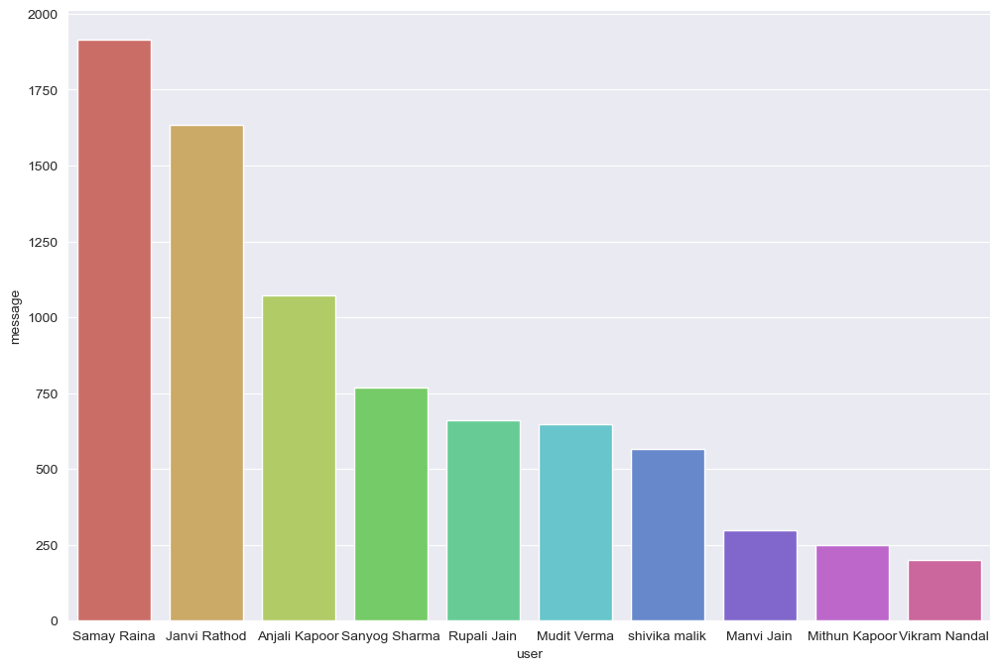

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Beautifying default styles using Seaborn
sns.set_style("darkgrid")

# Adjust font size and figure size
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = (12, 8)

# Create a bar plot for top 10 active users
sns.barplot(x='user', y='message', data=top10df, palette="hls")

# Save the plot
plt.savefig('top10_days.svg', format='svg')
plt.show()


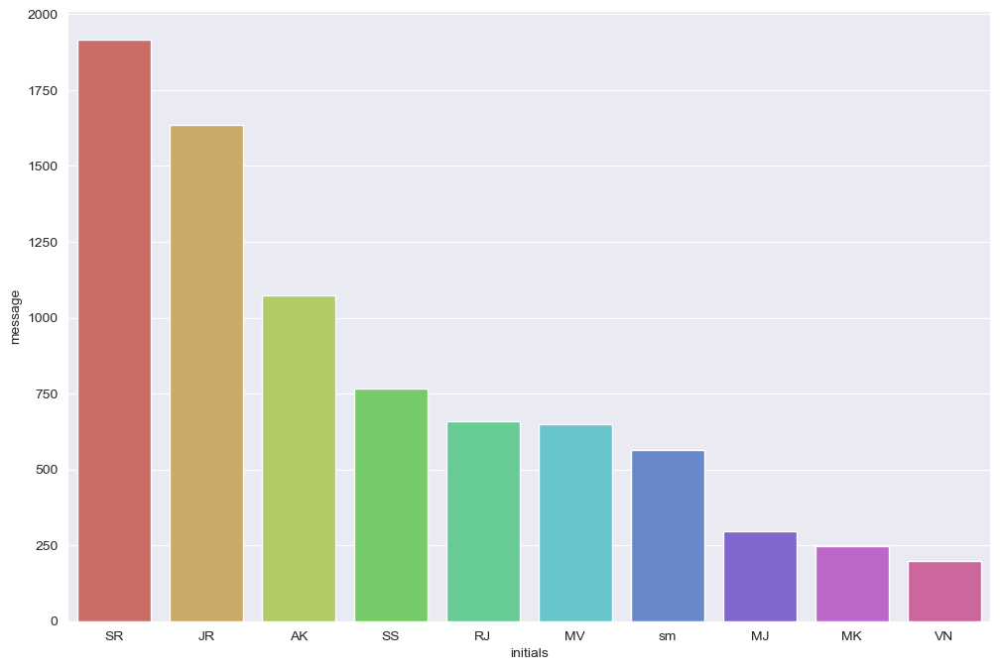

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

# Beautifying default styles using Seaborn
sns.set_style("darkgrid")

# Adjust font size and figure size
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = (12, 8)

# Create a bar plot for top 10 active users
sns.barplot(x='initials', y='message', data=top10df, palette="hls")

# Save the plot
plt.savefig('top10_days.svg', format='svg')
plt.show()


## 4. AVERAGE MESSAGE LENGTH OF TOP 10 MOST ACTIVE USERS OF THE GROUP

In [21]:
# Calculate the message length for each message
df2['message_length'] = df2['message'].apply(len)

# Calculate the average message length for each user
avg_msg_lengths = df2.groupby('user')['message_length'].mean().reset_index()
avg_msg_lengths.rename(columns={'message_length': 'avg_message_length'}, inplace=True)

# Merge the average message lengths with the top 10 active users
top10df = top10df.merge(avg_msg_lengths, on='user')

# Sort the DataFrame by average message length in descending order
top10df_msg = top10df.sort_values(by='avg_message_length', ascending=False)

# Display the DataFrame with average message lengths
print(top10df_msg)


            user  message initials  avg_message_length
9  Vikram Nandal      199       VN           60.889447
7     Manvi Jain      297       MJ           55.838384
4    Rupali Jain      660       RJ           49.904545
3  Sanyog Sharma      768       SS           35.128906
5    Mudit Verma      649       MV           32.896764
1   Janvi Rathod     1634       JR           32.451040
6  shivika malik      565       sm           31.224779
8  Mithun Kapoor      248       MK           29.177419
2  Anjali Kapoor     1072       AK           29.058769
0    Samay Raina     1916       SR           27.758351


In [22]:
import seaborn as sns

def get_colors_of_certain_order(order_list):
    """
    Generates a list of colors based on the order of unique items in order_list.
    
    Args:
    - order_list (list): A list of unique items
    
    Returns:
    - colors (list): A list of colors corresponding to the order of items in order_list
    """
    color_palette = sns.color_palette()
    num_colors = len(order_list)
    return [color_palette[i % len(color_palette)] for i in range(num_colors)]

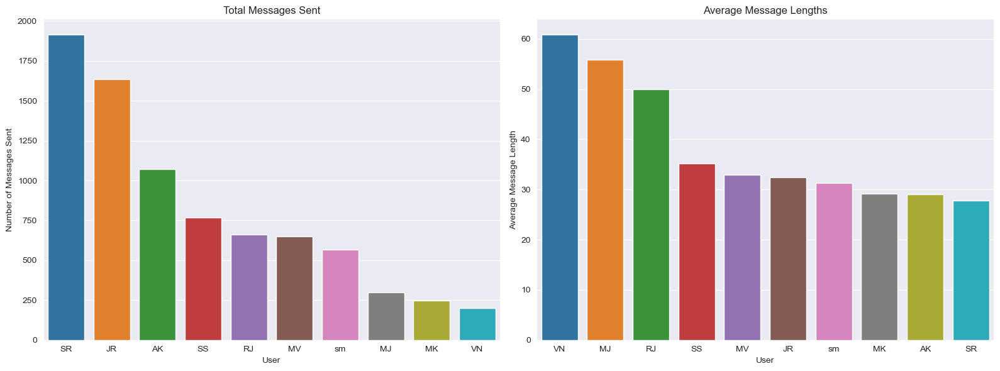

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the default style using Seaborn
sns.set_style("darkgrid")

# Plotting multiple charts in a grid
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1 - Countplot of total messages sent
sns.barplot(x=top10df['initials'], y=top10df['message'], ax=axes[0], palette=get_colors_of_certain_order(top10df['initials']))

axes[0].set_title('Total Messages Sent')
axes[0].set_xlabel('User')
axes[0].set_ylabel('Number of Messages Sent')

# Plot 2 - Barplot of the top 10 users' average message lengths
sns.barplot(x=top10df_msg['initials'], y=top10df_msg['avg_message_length'], ax=axes[1], palette=get_colors_of_certain_order(top10df_msg['initials']))

axes[1].set_title('Average Message Lengths')
axes[1].set_xlabel('User')
axes[1].set_ylabel('Average Message Length')

# Adjust the layout to prevent overlap
plt.tight_layout()

# Saving the plots
plt.savefig('top10_msg_plots_diff.svg', format='svg')
plt.show()


#####  
It’s really interesting to see plots like this side by side, because here comes the twist:
Ironically SR, the person who sent the most amount of texts , has least messages' length on average. This means this person sends broken and many WhatsApp messages in one go.


## 5. TOP 10 USER MOST SENT MEDIA

In [24]:
# Using `groupby`, `count` and `sort_values` attributes.
top10media = df[df.message == '<Media omitted> '].groupby('user').count().sort_values(by="message", ascending = False).head(10)

# Dropping unused column;
top10media.drop(columns=['date_time', 'day', 'month', 'year', 'date'], inplace=True)

# Renaming column name for visualization;
top10media.rename(columns={"message": "media_sent"}, inplace=True)

# resetting index;
top10media.reset_index(inplace=True)

top10media['initials'] = ''
for i in range(10):
    top10media.initials[i] = top10media.user[i].split()[0][0] + top10media.user[i].split()[1][0]
top10media.initials[9] = "VR"#It’s really interesting to see plots like this side by side, because here comes the twist:
#Ironically, TK, the person who sent the most amount of texts (2000+), has least messages' length on average. This means this person sends broken and many WhatsApp messages in one go.
#We can see that, I send less number of messages while having a relatively longer message length, followed by KS.
##Pre-processing
##We can use this to filter out and see who sends the most media.

# Using `groupby`, `count` and `sort_values` attributes.
top10media = df[df.message == '<Media omitted> '].groupby('user').count().sort_values(by="message", ascending = False).head(10)

# Dropping unused column;
top10media.drop(columns=['date_time', 'day', 'month', 'year', 'date'], inplace=True)

# Renaming column name for visualization;
top10media.rename(columns={"message": "media_sent"}, inplace=True)

# resetting index;
top10media.reset_index(inplace=True)

top10media['initials'] = ''
for i in range(10):
    top10media.initials[i] = top10media.user[i].split()[0][0] + top10media.user[i].split()[1][0]
 

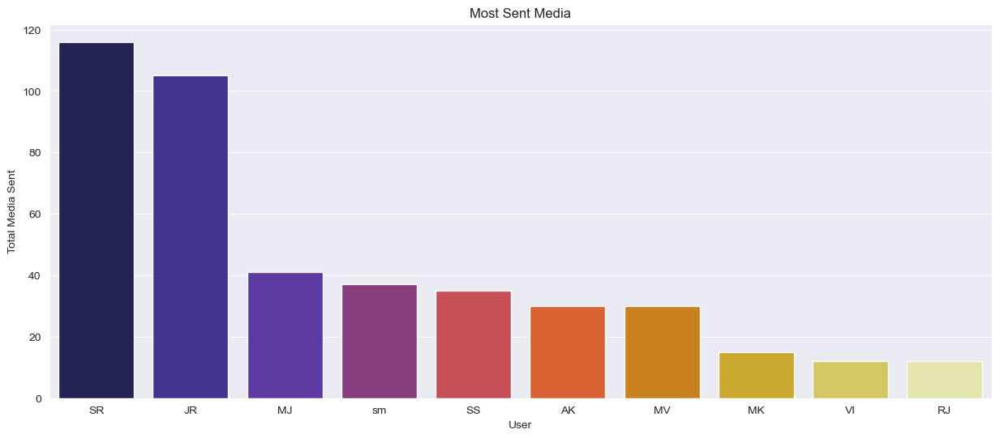

In [25]:
# Increasing the figure size
plt.figure(figsize=(15, 6))

# Beautifying Default Styles using Seaborn
sns.set_style("darkgrid")

# Plotting a bar graph
sns.barplot(x=top10media['initials'], y=top10media['media_sent'], palette="CMRmap")

plt.title('Most Sent Media')
plt.xlabel('User')
plt.ylabel('Total Media Sent')

# Saving the plots
plt.savefig('top10media.svg', format='svg')


In [26]:
print(top10media)

                        user  media_sent initials
0                Samay Raina         116       SR
1               Janvi Rathod         105       JR
2                 Manvi Jain          41       MJ
3              shivika malik          37       sm
4              Sanyog Sharma          35       SS
5              Anjali Kapoor          30       AK
6                Mudit Verma          30       MV
7              Mithun Kapoor          15       MK
8  Vivek Iyer (TSEC, Biomed)          12       VI
9                Rupali Jain          12       RJ


## 6. TOP 10 MOST USED EMOJI

In [27]:
 # Initialize a Counter to count emoji occurrences
emoji_ctr = Counter()

# Create a list of emojis
emojis_list = list(emoji.UNICODE_EMOJI.keys()) 

# Compile a regular expression pattern to match emojis
pattern = re.compile('|'.join(re.escape(p) for p in emojis_list))

# Iterate over each row in the DataFrame
for idx, row in df.iterrows():
    # Find emojis in the message using the compiled regular expression pattern
    emojis_found = pattern.findall(row["message"])
    # Increment the count of each emoji found
    for emoji_found in emojis_found:
        emoji_ctr[emoji_found] += 1 

In [28]:
pip install emoji_data_python

Note: you may need to restart the kernel to use updated packages.


In [29]:
from collections import Counter
import emoji_data_python
import re

# Initialize a Counter to count emoji occurrences
emoji_ctr = Counter()

# Create a list of emoji characters by extracting from EmojiChar objects
emojis_list = [emoji.char for emoji in emoji_data_python.emoji_data]

# Compile a regular expression pattern to match emojis
pattern = re.compile('|'.join(re.escape(p) for p in emojis_list))

# Iterate over each row in the DataFrame
for idx, row in df.iterrows():
    # Find emojis in the message using the compiled regular expression pattern
    emojis_found = pattern.findall(row["message"])
    # Increment the count of each emoji found
    for emoji_found in emojis_found:
        emoji_ctr[emoji_found] += 1


In [30]:
import pandas as pd
import emoji

# Create a DataFrame to store information about the top 10 emojis
top10emojis = pd.DataFrame(index=range(10), columns=["emoji", "emoji_count", "emoji_description"])

# Iterate over the top 10 emojis and populate the DataFrame
for i, (emoji_char, count) in enumerate(emoji_ctr.most_common(10)):
    # Demojize the emoji to get a plain text representation
    description = emoji.demojize(emoji_char)[1:-1]  # Remove the colons ':' at the beginning and end
    
    # Populate the DataFrame with emoji information
    top10emojis.at[i, 'emoji'] = emoji_char
    top10emojis.at[i, 'emoji_count'] = count
    top10emojis.at[i, 'emoji_description'] = description

# Display the DataFrame
top10emojis


,emoji,emoji_count,emoji_description
0,😂,1422,face_with_tears_of_joy
1,👍,313,thumbs_up
2,🏻,239,light_skin_tone
3,🔥,201,fire
4,😅,170,grinning_face_with_sweat
5,💯,145,hundred_points
6,🤣,110,rolling_on_the_floor_laughing
7,👏,68,clapping_hands
8,🤦‍♂️,67,man_facepalming
9,🙌,66,raising_hands


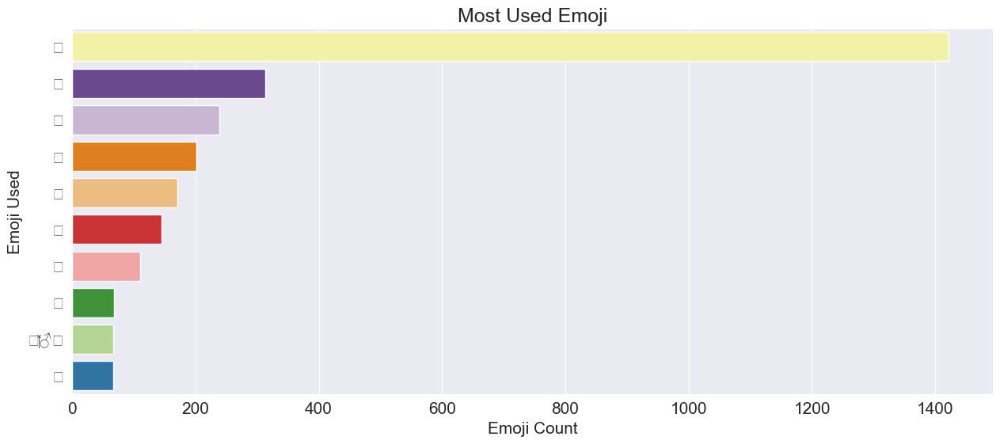

In [31]:
 import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size and font size
plt.figure(figsize=(15, 6))
import matplotlib
matplotlib.rcParams['font.size'] = 15

# Set seaborn style
sns.set_style("darkgrid")

# Plotting
sns.barplot(x='emoji_count', y='emoji', data=top10emojis, palette="Paired_r")

# Title and labels
plt.title('Most Used Emoji')
plt.xlabel('Emoji Count')
plt.ylabel('Emoji Used')

# Save plot
plt.savefig('top10emoji.svg', format='svg')
plt.show()


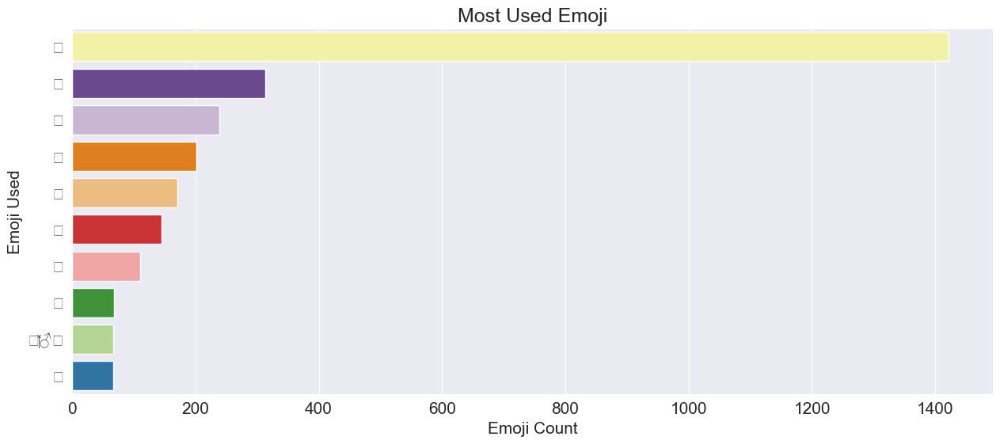

In [32]:
import pandas as pd
import emoji
import matplotlib.pyplot as plt
import seaborn as sns

# Specify font that supports emojis
plt.rcParams['font.family'] = 'Arial Unicode MS'

# Create a DataFrame to store information about the top 10 emojis
top10emojis = pd.DataFrame(index=range(10), columns=["emoji", "emoji_count", "emoji_description"])

# Iterate over the top 10 emojis and populate the DataFrame
for i, (emoji_char, count) in enumerate(emoji_ctr.most_common(10)):
    # Demojize the emoji to get a plain text representation
    description = emoji.demojize(emoji_char)[1:-1]  # Remove the colons ':' at the beginning and end
    
    # Populate the DataFrame with emoji information
    top10emojis.at[i, 'emoji'] = emoji_char
    top10emojis.at[i, 'emoji_count'] = count
    top10emojis.at[i, 'emoji_description'] = description

# Set figure size and font size
plt.figure(figsize=(15, 6))
plt.rcParams['font.size'] = 15

# Set seaborn style
sns.set_style("darkgrid")

# Plotting
sns.barplot(x='emoji_count', y='emoji', data=top10emojis, palette="Paired_r")

# Title and labels
plt.title('Most Used Emoji')
plt.xlabel('Emoji Count')
plt.ylabel('Emoji Used')

# Save plot
plt.savefig('top10emoji.svg', format='svg')
plt.show()

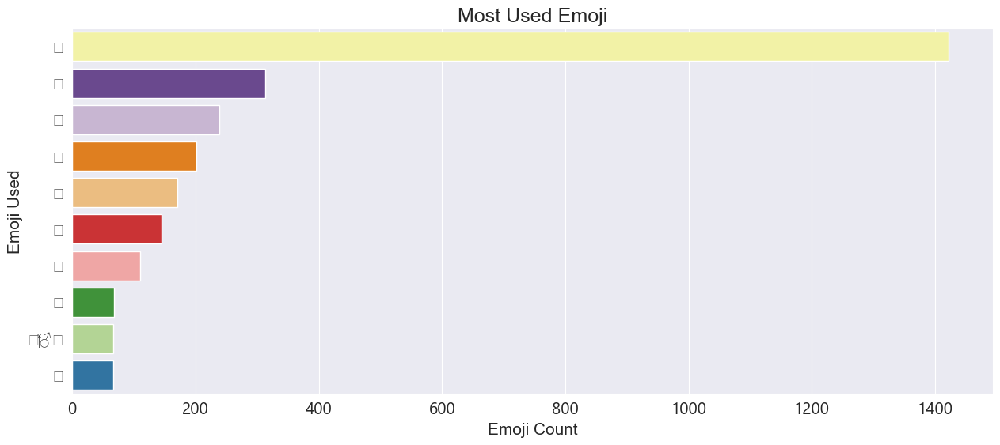

In [33]:
 import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size and font size
plt.figure(figsize=(15, 6))
import matplotlib
matplotlib.rcParams['font.size'] = 15

# Set seaborn style
sns.set_style("darkgrid")

# Plotting
sns.barplot(y='emoji', x='emoji_count', data=top10emojis, palette="Paired_r")

# Title and labels
plt.title('Most Used Emoji')
plt.xlabel('Emoji Count')
plt.ylabel('Emoji Used')

# Set font family to support emojis
plt.xticks(fontname='Segoe UI Emoji')

# Save plot
plt.savefig('top10emoji.svg', format='svg')
plt.show()


In [34]:
import plotly.express as px
fig = px.treemap(top10emojis, path= ['emoji'],
    values = top10emojis['emoji_count'].tolist(),
)
fig.show()

## 7. MOST ACTIVE DAY, MOST ACTIVE HOURS AND MOST ACTIVE MONTHS

In [35]:
# Create a copy of the DataFrame
df3 = df.copy()

# Set all values in 'message_count' column to 1
df3['message_count'] = 1  

# Extract hour from datetime
df3['hour'] = df3['date_time'].dt.hour

# Group by hour and sum message counts
grouped_by_time = df3.groupby('hour')['message_count'].sum().reset_index()


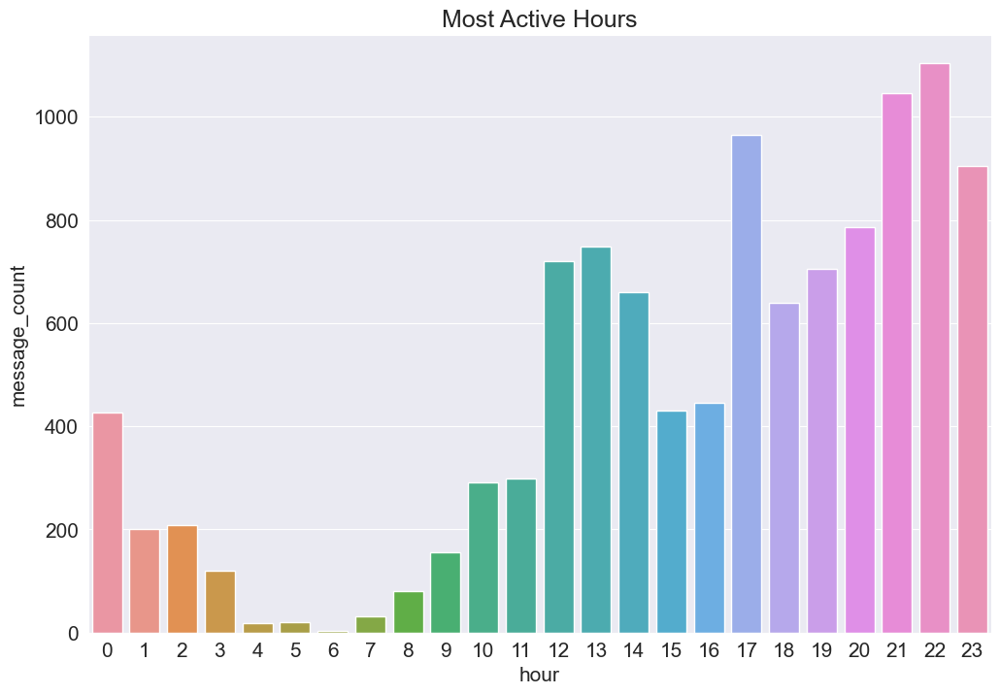

In [36]:
 import seaborn as sns
import matplotlib.pyplot as plt

# Create a bar plot
sns.barplot(x='hour', y='message_count', data=grouped_by_time)

# Add title
plt.title('Most Active Hours')

# Save the plot
plt.savefig('most_active_hours.svg', format='svg')
plt.show()


In [37]:
import pandas as pd

# Extracting weekday and month from the datetime column
df3['day'] = df3['date_time'].dt.day_name()
df3['month_name'] = df3['date_time'].dt.month_name()

# Specific order to be printed in for weekdays
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Grouping by day
grouped_by_day = df3.groupby('day')['message_count'].sum().reindex(days).reset_index()

# Specific order to be printed in for months
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
# Grouping by month
grouped_by_month = df3.groupby('month_name')['message_count'].sum().reindex(months).reset_index()


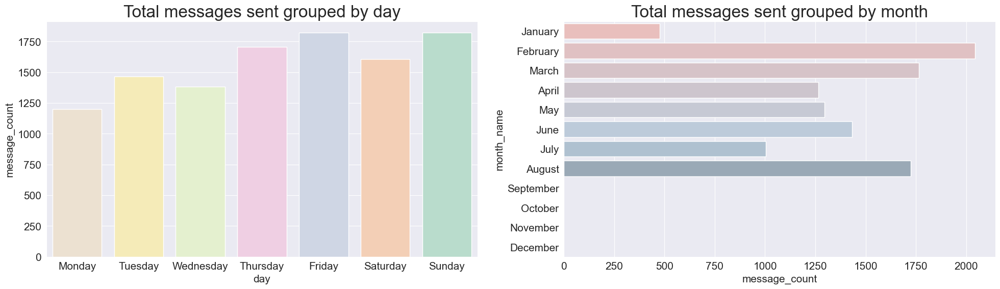

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(24, 6))

# Set font size for better readability
import matplotlib
matplotlib.rcParams['font.size'] = 20

# Set seaborn style
sns.set_style("darkgrid")

# Plotting

# PLOT 1: Messages grouped by day
sns.barplot(x='day', y='message_count', data=grouped_by_day, order=days, ax=axs[0], palette='Pastel2_r')
axs[0].set_title('Total messages sent grouped by day')

# PLOT 2: Messages grouped by month
sns.barplot(x='message_count', y='month_name', data=grouped_by_month, order=months, ax=axs[1], palette='Pastel1_d')
axs[1].set_title('Total messages sent grouped by month')

# Save the plots
plt.savefig('days_and_month.svg', format='svg')
plt.show()


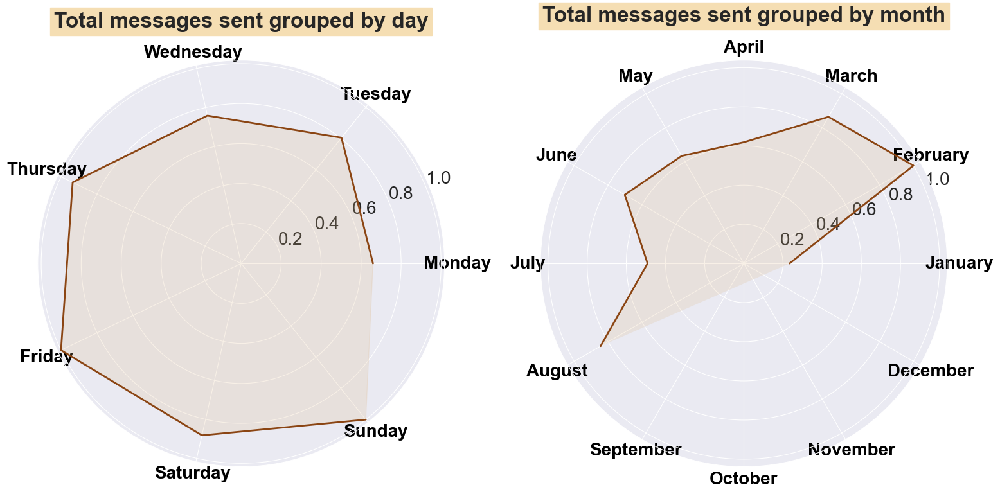

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df3 is your DataFrame with necessary columns

# Extracting weekday and month from the datetime column
df3['day'] = df3['date_time'].dt.day_name()
df3['month_name'] = df3['date_time'].dt.month_name()

# Specific order to be printed in for weekdays
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Grouping by day
grouped_by_day = df3.groupby('day')['message_count'].sum().reindex(days).reset_index()

# Specific order to be printed in for months
months =['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
# Grouping by month
grouped_by_month = df3.groupby('month_name')['message_count'].sum().reindex(months).reset_index()

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 8), subplot_kw={'projection': 'polar'})

# PLOT 1: Messages grouped by day (Spider Plot)
angles_day = np.linspace(0, 2 * np.pi, len(days), endpoint=False).tolist()
values_day = grouped_by_day['message_count'].tolist()
max_value_day = max(values_day)
values_day_normalized = [v / max_value_day for v in values_day]  # Normalize values
axs[0].plot(angles_day, values_day_normalized, linestyle='-', color='saddlebrown', linewidth=2)
axs[0].fill(angles_day, values_day_normalized, alpha=0.2, color='burlywood')  # Brown and antiquewhite colors

axs[0].set_xticks(angles_day)
axs[0].set_xticklabels(days, fontweight='bold', color='black')  # Bold and black days
axs[0].tick_params(axis='x', colors='black')  # Set the color of the radial ticks
axs[0].set_title('Total messages sent grouped by day', fontweight='bold', backgroundcolor='wheat', pad=20)  # Added pad for more space after title

# PLOT 2: Messages grouped by month (Spider Plot)
angles_month = np.linspace(0, 2 * np.pi, len(months), endpoint=False).tolist()
values_month = grouped_by_month['message_count'].tolist()
max_value_month = max(values_month)
values_month_normalized = [v / max_value_month for v in values_month]  # Normalize values
axs[1].plot(angles_month, values_month_normalized, linestyle='-', color='saddlebrown', linewidth=2)
axs[1].fill(angles_month, values_month_normalized, alpha=0.2, color='burlywood')  # Brown and antiquewhite colors

axs[1].set_xticks(angles_month)
axs[1].set_xticklabels(months, fontweight='bold', color='black')  # Bold and black months
axs[1].tick_params(axis='x', colors='black')  # Set the color of the radial ticks
axs[1].set_title('Total messages sent grouped by month', fontweight='bold', backgroundcolor='wheat', pad=20)  # Added pad for more space after title

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()


## 8.WORDCLOUD

In [40]:
from wordcloud import WordCloud, STOPWORDS

# Initialize an empty string to store words
comment_words = ''

# Define stopwords to be avoided in the WordCloud
stopwords = set(STOPWORDS)
stopwords.update(['group', 'link', 'invite', 'joined', 'message', 'deleted', 'yeah', 'hai', 'yes', 'okay', 'ok', 'will', 'use', 'using', 'one', 'know', 'guy', 'group', 'media', 'omitted'])

# Iterate through the DataFrame
for val in df3.message.values:
    # Convert val to string
    val = str(val)
    # Split the value into tokens
    tokens = val.split()
    # Convert tokens to lowercase
    tokens = [token.lower() for token in tokens]
    # Append tokens to comment_words
    comment_words += " ".join(tokens) + " "

# Generate WordCloud
wordcloud = WordCloud(width=600, height=600, background_color='white', stopwords=stopwords, min_font_size=8).generate(comment_words)


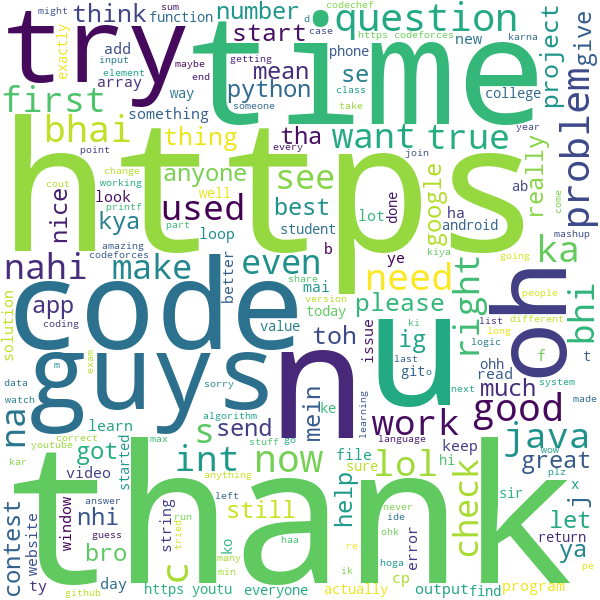

In [41]:
wordcloud.to_image()

## WORDCLOUD OF TOP 10 ACTIVE USERS

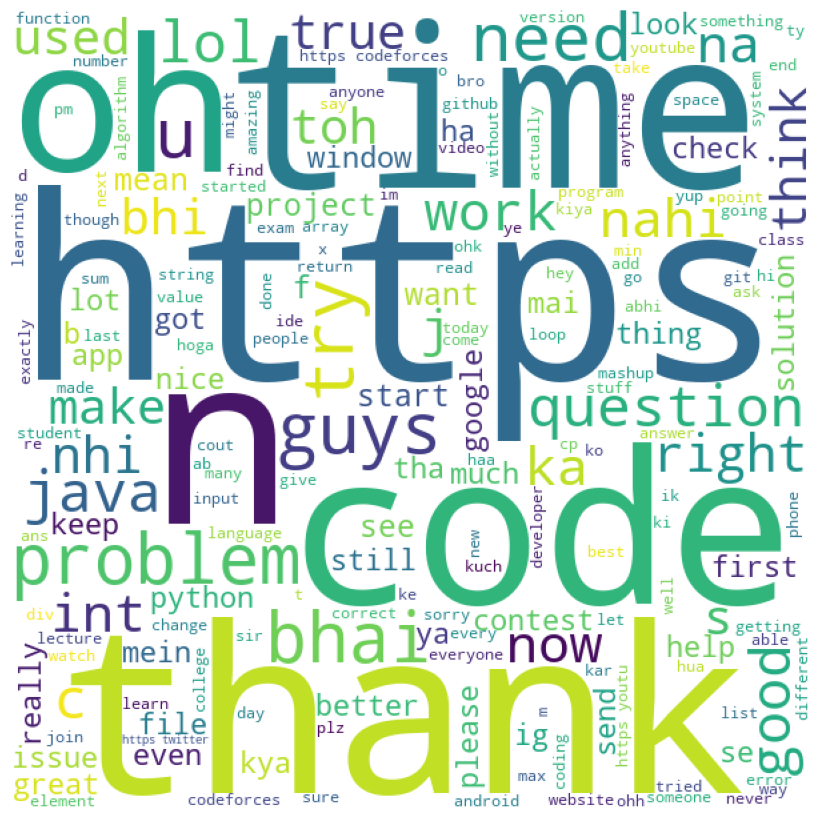

In [42]:
from collections import Counter
from wordcloud import WordCloud, STOPWORDS

# Define stopwords to be avoided in the WordCloud
stopwords = set(STOPWORDS)
stopwords.update(['group', 'link', 'invite', 'joined', 'message', 'deleted', 'yeah', 'hai', 'yes', 'okay', 'ok', 'will', 'use', 'using', 'one', 'know', 'guy', 'group', 'media', 'omitted'])

# Initialize an empty string to store words for top users
top_users_comment_words = ''

# Iterate through the DataFrame for top users
for user in top10df['user']:
    # Get all messages for the current user
    messages_for_user = df3[df3['user'] == user]['message']
    # Iterate through the messages
    for val in messages_for_user.values:
        # Convert val to string
        val = str(val)
        # Split the value into tokens
        tokens = val.split()
        # Convert tokens to lowercase
        tokens = [token.lower() for token in tokens]
        # Append tokens to top_users_comment_words
        top_users_comment_words += " ".join(tokens) + " "

# Generate WordCloud for top users
wordcloud_top_users = WordCloud(width=600, height=600, background_color='white', stopwords=stopwords, min_font_size=8).generate(top_users_comment_words)

# Display the WordCloud
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud_top_users)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

## 9.HEATMAP COMBINING MSG SENT BY MONTH AND DAY

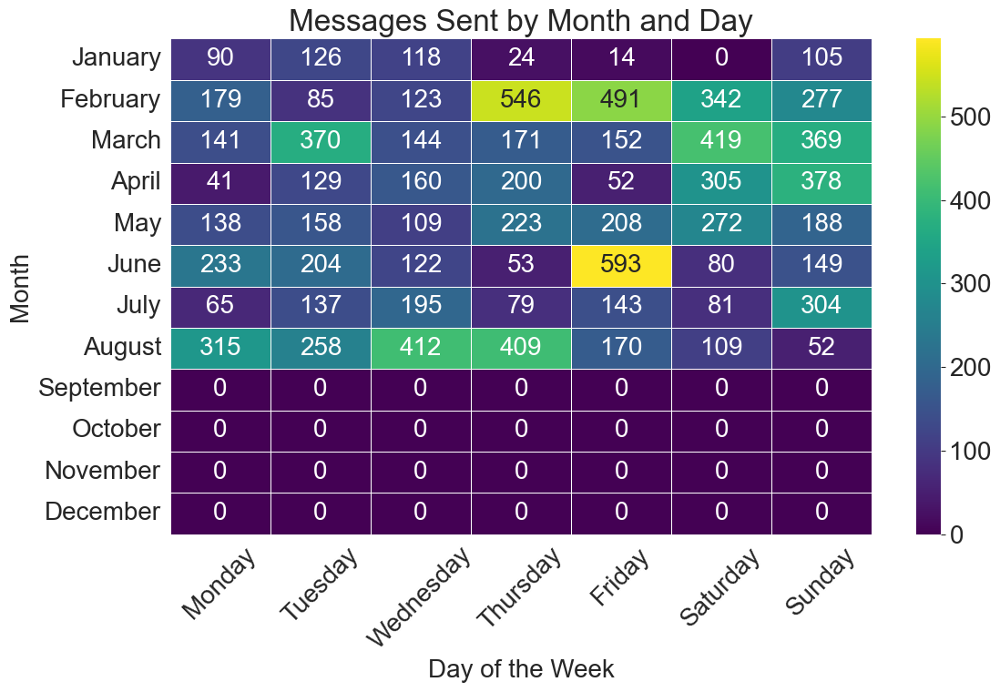

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pre-processing by day and month
grouped_by_day_and_month = df3.groupby(['day', 'month_name']).size().reset_index(name='message_count')

# Pivot the DataFrame to have days as columns, months as index, and message counts as values
pivot_table = grouped_by_day_and_month.pivot(index='month_name', columns='day', values='message_count')

# Reorder the rows to have months in chronological order
pivot_table = pivot_table.reindex(index=months)

# Specify the order of the days (Monday to Sunday)
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pivot_table = pivot_table[days_order]

# Fill missing values with zeros
pivot_table = pivot_table.fillna(0)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='viridis', annot=True, fmt='g', linewidths=.5)
plt.title('Messages Sent by Month and Day')
plt.xlabel('Day of the Week')
plt.ylabel('Month')
plt.xticks(rotation=45)
plt.tight_layout()

# Saving the plot
plt.savefig('month_day_heatmap.svg', format='svg')
plt.show()


## 10. THREE METHODS FOR IDENTIFYING SPAM MESSAGES IN GROUP CHAT

In [44]:
#This code identifies and displays messages that have more than 3 words and have been sent 10 or more times in the chat group
#along with the user who sent each message and the count of occurrences-/

In [45]:
import pandas as pd

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information

# Filter messages with more than 3 words
df['word_count'] = df['message'].apply(lambda x: len(x.split()))
filtered_df = df[df['word_count'] > 3]

# Count the occurrences of each message
message_counts = filtered_df['message'].value_counts()

# Filter messages sent 10 or more times
duplicates = message_counts[message_counts >= 10]

# Get the messages sent 10 or more times
duplicates_messages = duplicates.index.tolist()

# Filter the DataFrame to get rows with duplicate messages
duplicate_rows = filtered_df[filtered_df['message'].isin(duplicates_messages)]

# Group by message and user, then count the occurrences
duplicate_counts = duplicate_rows.groupby(['message', 'user']).size().reset_index(name='count')

# Filter to keep only messages sent 10 or more times
duplicate_counts = duplicate_counts[duplicate_counts['count'] >= 10]

# Display the DataFrame
print(duplicate_counts)


                      message             user  count
25  This message was deleted   +91 95949 08570     10
38  This message was deleted     Anjali Kapoor     22
42  This message was deleted      Janvi Rathod     24
43  This message was deleted     Mithun Kapoor     13
48  This message was deleted       Samay Raina     49
50  This message was deleted     Vikram Nandal     13
53  This message was deleted     shivika malik     38
54  You deleted this message        Manvi Jain     14


In [46]:
#SHOW THE MESSAGES THAT HAVE WORD COUNT OF MORE THAN 70 WORDS AND MAY BE THE SPAM MESSAGES!!
import pandas as pd

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information

# Filter messages with more than 5 words
df['word_count'] = df['message'].apply(lambda x: len(x.split()))
filtered_df = df[df['word_count'] > 70]

# Select only the 'user' and 'message' columns
filtered_messages = filtered_df[['user', 'message']]

# Display the DataFrame
print(filtered_messages)

                  user                                            message
177      Anjali Kapoor  #include <conio.h> #include <stdio.h>  void ma...
362      Anjali Kapoor  #include <conio.h> #include <stdio.h>  int mai...
467    +91 89764 07509  #include <stdio.h> #include <string.h>  void m...
471    +91 89764 07509  #include <stdio.h> #include <string.h>  void m...
887    +91 79770 56210  #include <stdio.h> void main() {     int total...
944         Manvi Jain  Find a pair (n,r) in an integer array such tha...
976    +91 70394 60876  Sussutu is a world-renowned magician. And rece...
1363        Manvi Jain  Sussutu is a world-renowned magician. And rece...
2496       Rupali Jain  ```import java.util.Scanner; import java.util....
2570      Janvi Rathod  *Some of really important website for a Develo...
2871     Sanyog Sharma  #include <map> #include<iostream> using namesp...
3274   +91 93598 18687  *Saul Bellow* exclaimed - People can lose thei...
3327   +91 73043 57388  Competitive pr

In [47]:
#SHOW THE MESSAGES THAT HAVE WORD COUNT OF MORE THAN 15 WORDS AND SENT MORE THAN ONE TIME AND MAY BE THE SPAM MESSAGES!!
import pandas as pd

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information

# Calculate the word count for each message
df['word_count'] = df['message'].apply(lambda x: len(x.split()))

# Filter messages with more than 100 words
filtered_df = df[df['word_count'] > 15]

# Group by message and user, then count the occurrences
message_counts = filtered_df.groupby(['message', 'user']).size().reset_index(name='count')

# Filter to keep only messages sent more than once
message_counts = message_counts[message_counts['count'] > 1]

# Select only the 'user', 'message', and 'count' columns
filtered_messages = message_counts[['user', 'message', 'count']]

# Display the DataFrame
print(filtered_messages)

               user                                            message  count
30  +91 72762 35231  *2 Months of Netflix Premium Free at no cost F...      3


# 11. Extract potential keywords related to criminal activities

In [48]:
def extract_potential_criminal_keywords(text):
    # Define a list of keywords related to criminal activities
    keywords = ['murder', 'homicide', 'assault', 'robbery', 'theft', 'burglary', 'larceny', 'arson', 'kidnapping', 'abduction', 'ransom', 'extortion', 'blackmail', 'carjacking', 'home invasion', 'sexual assault', 'rape', 'sexual abuse', 'pedophilia', 'child abuse', 'child neglect', 'domestic violence', 'stalking', 'harassment', 'cyberbullying', 'bullying', 'terrorism', 'terrorist attack', 'bombing', 'shooting', 'mass shooting', 'hijacking', 'hijack', 'hate crime', 'hate speech', 'ethnic cleansing', 'genocide', 'war crime', 'torture', 'human rights violation', 'death penalty', 'execution', 'suicide', 'suicide bombing', 'illegal arms dealing', 'weapons trafficking', 'gun trafficking', 'illegal firearm possession', 'organized robbery', 'money counterfeiting', 'document forgery', 'identity fraud', 'embezzlement scheme', 'ponzi investment', 'corporate bribery', 'political scandal', 'election fraud', 'voter fraud', 'false testimony', 'perjury', 'public corruption', 'judicial bribery', 'court tampering', 'legal malpractice', 'academic dishonesty', 'academic fraud', 'plagiarism', 'cyber espionage', 'cyber terrorism', 'cyber attack', 'malware', 'hacking', 'phishing', 'identity theft', 'cyber theft', 'money laundering', 'laundering operation', 'illegal money transfer', 'tax evasion', 'tax avoidance', 'offshore account', 'illegal wildlife trade', 'poaching', 'endangered species trafficking', 'environmental crime', 'pollution crime', 'ecological disaster', 'oil spill', 'hazardous waste dumping', 'illegal logging', 'wildlife smuggling', 'ivory trafficking', 'illegal fishing', 'overfishing', 'piracy', 'copyright infringement', 'software piracy', 'film piracy', 'music piracy', 'bootlegging', 'alcohol smuggling', 'drug cultivation', 'illegal mining', 'blood diamond', 'conflict diamond', 'antiquities smuggling', 'art theft', 'artifact smuggling', 'cultural heritage crime', 'cultural property theft', 'human experimentation', 'unethical research', 'medical malpractice', 'patient abuse', 'insurance scam', 'healthcare fraud', 'pharmaceutical fraud', 'product tampering', 'food adulteration', 'food contamination', 'product recall', 'workplace harassment', 'workplace discrimination', 'labor exploitation', 'slavery', 'forced labor', 'child labor', 'child soldiering', 'child marriage', 'forced marriage', 'arranged marriage', 'arranged child marriage', 'early marriage', 'forced prostitution', 'child prostitution', 'sex tourism', 'sex slavery', 'forced abortion', 'gender-based violence', 'honor killing', 'female genital mutilation', 'forced sterilization', 'forced organ harvesting', 'organ trafficking', 'illegal adoption', 'baby trafficking', 'baby farming', 'child soldier recruitment', 'child soldier use', 'child soldier rehabilitation', 'child soldier reintegration', 'child soldier demobilization', 'drug', 'drugs', 'narcotic', 'narcotics', 'trafficking', 'trafficker', 'traffickers', 'trafficking ring', 'drug cartel', 'drug lord', 'drug trade', 'drug smuggling', 'drug dealing', 'drug abuse', 'drug addiction', 'substance abuse', 'illegal drug', 'illicit drug', 'cocaine', 'heroin', 'marijuana', 'cannabis', 'methamphetamine', 'ecstasy', 'LSD', 'crack cocaine', 'opium', 'fentanyl', 'prescription drug abuse', 'prescription drug fraud', 'prescription drug trafficking', 'opioid trafficking', 'opioid epidemic', 'synthetic drug', 'designer drug', 'party drug', 'performance-enhancing drug', 'doping', 'steroid', 'anabolic steroid', 'steroid trafficking', 'steroid abuse', 'steroid scandal', 'fraud', 'fraudulent', 'fraudster', 'fraudulence', 'scam', 'scams', 'scammer', 'scamming', 'scam artist', 'con artist', 'confidence trick', 'confidence scheme', 'pyramid scheme', 'Ponzi scheme', 'investment fraud', 'securities fraud', 'wire fraud', 'mail fraud', 'identity theft', 'credit card fraud', 'insurance fraud', 'tax fraud', 'welfare fraud', 'mortgage fraud', 'bank fraud', 'accounting fraud', 'corporate fraud', 'white-collar crime', 'embezzlement', 'forgery', 'counterfeiting', 'money laundering', 'launder money', 'laundering scheme', 'dirty money', 'black money', 'illegal money', 'underground economy', 'corruption', 'corrupt', 'corrupt practices', 'bribery', 'bribe', 'kickback', 'graft', 'embezzle', 'embezzler', 'corrupt official', 'political corruption', 'police corruption', 'judicial corruption', 'organized crime', 'racketeering', 'mafia', 'mob', 'mobster', 'syndicate', 'criminal organization', 'underworld', 'illegal trade', 'black market', 'illegal gambling', 'human trafficking', 'sex trafficking', 'child trafficking', 'organ trafficking', 'illegal arms trade', 'arms smuggling', 'terrorist financing', 'cybercrime', 'cybercriminal', 'cyber fraud', 'cyber scam', 'dark web', 'illicit trade', 'contraband', 'contraband smuggling', 'contraband trade', 'contraband trafficking', 'illicit goods', 'illegal immigration', 'undocumented immigration', 'human smuggling', 'border smuggling', 'smuggling route', 'smuggling operation', 'smuggling network', 'scam']
    # Compile a regular expression pattern to match the keywords
    pattern = re.compile('|'.join(keywords), flags=re.IGNORECASE)
    # Find all occurrences of keywords in the text
    matches = pattern.findall(text)
    # Return a list of unique matched keywords
    return list(set(matches))

# Apply the function to extract potential criminal keywords from each message
df['potential_criminal_keywords'] = df['message'].apply(extract_potential_criminal_keywords)

# Filter messages with potential criminal keywords
potential_criminal_messages = df[df['potential_criminal_keywords'].apply(len) > 0]

# Display the messages containing potential criminal keywords along with the usernames
print(potential_criminal_messages[['user', 'message', 'potential_criminal_keywords']])


                        user  \
436               Manvi Jain   
1317           Anjali Kapoor   
1320            Janvi Rathod   
1708         +91 82080 02653   
2823              Manvi Jain   
4007           Anjali Kapoor   
4077            Janvi Rathod   
4303             Rupali Jain   
4648        Saket (TSEC, CS)   
5094             Samay Raina   
6273            Janvi Rathod   
6429             Samay Raina   
6545             Samay Raina   
6815         +91 84335 18102   
6934   Keyul Jain (TSEC, CS)   
7063           Vikram Nandal   
7064         +91 99693 94098   
7121           Vikram Nandal   
7271           Anjali Kapoor   
7286              Manvi Jain   
7304             Mudit Verma   
8240         +91 73043 57388   
8843             Samay Raina   
8866         +91 98206 01141   
8905         +91 73043 57388   
9236           Sanyog Sharma   
9392           Anjali Kapoor   
9402         +91 88284 70904   
9987         +91 88284 70904   
9988           Anjali Kapoor   
10544   

# 12. Translation of Messages containing potential keywords related to criminal          activities

In [49]:
import pandas as pd
from googletrans import Translator
import re

def translate_messages(messages, source_lang, target_lang):
    translator = Translator()
    translated_messages = []
    for message in messages:
        try:
            translation = translator.translate(message, src=source_lang, dest=target_lang)
            translated_messages.append(translation.text)
        except Exception as e:
            print(f"Error translating message: {message}")
            print(f"Error details: {e}")
            translated_messages.append("Translation Error")
    return translated_messages
# Apply the function to extract potential criminal keywords from each message
df['potential_criminal_keywords'] = df['message'].apply(extract_potential_criminal_keywords)

# Filter messages with potential criminal keywords
potential_criminal_messages = df[df['potential_criminal_keywords'].apply(len) > 0]

# Select messages with criminal keywords
messages_with_criminal_keywords = potential_criminal_messages['message'].tolist()

# Translate messages with criminal keywords
translated_messages = translate_messages(messages_with_criminal_keywords, source_lang='en', target_lang='ja')

# Create a DataFrame to store the original and translated messages
translated_df = pd.DataFrame({'original_message': messages_with_criminal_keywords, 'translated_message': translated_messages})

# Display the DataFrame with translated messages
print(translated_df)

Error translating message: https://docs.google.com/forms/d/e/1FAIpQLSd4CfJxydDDZGSzlTPVeiWQDM6XInm3gZZaDk9oc9y--1dxeA/viewform 
Error details: list index out of range
Error translating message: https://threatpost.com/apis-next-frontier-cybercrime/158536/ 
Error details: list index out of range
                                     original_message  \
0   It was a normal text editor. And we used termi...   
1                      Anyone interested in hacking?    
2                   We've got a hacking community  B    
3   [Name]Shruti Jain; [Phone number] Mobile：70452...   
4   https://docs.google.com/forms/d/e/1FAIpQLSd4Cf...   
5                               Bhai ye sab scam hai    
6   https://fightwithcovid.github.io/web/  Mobile ...   
7                         (Not intended for mobile).    
8                            Execution time *4 secs*    
9               Are u guys doing the hacking thing😅?    
10                                   Not for mobile.    
11  // A tricky Java 

# 13.Extract links from messages and return the user who sent the message

In [50]:
def extract_links_and_user(text):
    # Regular expression pattern to match URLs
    url_pattern = r'https?://\S+|www\.\S+'
    # Find all occurrences of URLs in the text
    urls = re.findall(url_pattern, text)
    # Return a tuple containing the user and the list of URLs found
    return urls

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information

# Apply the function to extract links and users from each message
df['links_and_user'] = df.apply(lambda row: extract_links_and_user(row['message']), axis=1)

# Filter messages with links
messages_with_links = df[df['links_and_user'].apply(lambda x: len(x)) > 0]

# Display the messages containing links along with the usernames
for index, row in messages_with_links.iterrows():
    user = row['user']
    links = row['links_and_user']
    print(f"User: {user}\nLinks: {links}\n")


User: Chirag Sharma (TSEC, CS)
Links: ['https://youtu.be/AU7mADJMa9Y']

User: Pranay Thakur (TSEC, CS)
Links: ['https://youtu.be/aZu084TPInE']

User: Janvi Rathod
Links: ['http://meetu.ps/e/HKD5Q/BGt8n/d']

User: Janvi Rathod
Links: ['https://www.youtube.com/watch?v=fUqpYvIYj-Y']

User: Janvi Rathod
Links: ['https://www.youtube.com/playlist?list=PLDN4rrl48XKpZkf03iYFl-O29szjTrs_O']

User: Janvi Rathod
Links: ['https://youtu.be/4eWKHLSRHPY']

User: Samay Raina
Links: ['https://research.hackerrank.com/developer-skills/2020?utm_medium=social&utm_source=instagram&utm_campaign=021420&utm_content=IGPoll']

User: +91 82080 02653
Links: ['https://forms.gle/27DSsnJnBBMRy6Bt8']

User: +91 90822 59476
Links: ['https://code.dcoder.tech/files/code/5e3d7fad3975f256bf9d10e8/practice']

User: Samay Raina
Links: ['https://code.dcoder.tech/files/code/5e4a61595e611d351827daec/hell']

User: Anjali Kapoor
Links: ['https://code.dcoder.tech/files/code/5e4c15209e436e412f89d805/right-angled-triangle']

User: J

# 14.TO FIND TOP 10 MOST SHARED LINKS ALONG WITH SOME OTHER DETAILS

In [51]:
 import pandas as pd
import re
from collections import Counter

# Function to extract links from messages
def extract_links(text):
    # Regular expression pattern to match URLs
    url_pattern = r'https?://\S+|www\.\S+'
    # Find all occurrences of URLs in the text
    urls = re.findall(url_pattern, text)
    # Return the list of URLs found
    return urls

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information
# Assuming 'date_time' column contains the date and time information

# Apply the function to extract links from each message
df['links'] = df['message'].apply(extract_links)

# Flatten the list of links
all_links = [link for links in df['links'] for link in links]

# Count the frequency of each link
link_counts = Counter(all_links)

# Get the top 10 most shared links
top_10_links = link_counts.most_common(10)

# Create a dictionary to store users who shared each link along with the count of shares and date_time
link_users_count_date = {link: Counter() for link, _ in top_10_links}

# Iterate through each row to populate the link_users_count_date dictionary
for index, row in df.iterrows():
    for link in row['links']:
        if link in link_users_count_date:
            link_users_count_date[link][(row['user'], row['date_time'])] += 1

# Display the top 10 most shared links along with their counts, users who shared each link, count of shares by each user, and date and time of each share
for link, count in top_10_links:
    print(f"Link: {link}, Count: {count}")
    print("Users who shared this link with the count and date/time:")
    for (user, date_time), share_count in link_users_count_date[link].items():
        print(f"User: {user}, Share Count: {share_count}, Date/Time: {date_time}")
    print()


Link: www.peopleperhour.com, Count: 9
Users who shared this link with the count and date/time:
User: Mudit Verma, Share Count: 1, Date/Time: 2020-02-21 01:28:00
User: Janvi Rathod, Share Count: 4, Date/Time: 2020-03-01 14:46:00
User: Janvi Rathod, Share Count: 4, Date/Time: 2020-06-16 19:05:00

Link: www.teamtreehouse.com, Count: 4
Users who shared this link with the count and date/time:
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-03-01 14:46:00
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-06-16 19:05:00

Link: www.tutorialspoint.com, Count: 4
Users who shared this link with the count and date/time:
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-03-01 14:46:00
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-06-16 19:05:00

Link: www.khamsat.com, Count: 4
Users who shared this link with the count and date/time:
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-03-01 14:46:00
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-06-16 19:05:00

Link: www.fiverr.co

# 15.KEYWORD EXTRACTION

In [52]:
!pip install rake-nltk

import rake_nltk
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vidhu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [53]:
def keyword_extraction(text):
    rake = rake_nltk.Rake()
    rake.extract_keywords_from_text(text)
    keywords = rake.get_ranked_phrases()
    return keywords

# Example usage
df['keywords'] = df['message'].apply(keyword_extraction)
for index, row in df.iterrows():
    print("Keywords for message {}: {}".format(index, row['keywords']))


Keywords for message 0: ['one outside', 'even whatsapp', 'end encrypted', 'end', 'tap', 'read', 'messages', 'listen', 'learn', 'chat', 'calls']
Keywords for message 1: ['samay raina created group', 'coders 👨\u200d💻👩\u200d💻🖥💻"']
Keywords for message 2: ['joined using', 'invite link', 'group']
Keywords for message 3: ['91 99871 38558 joined using', 'invite link', 'group']
Keywords for message 4: ['91 91680 38866 joined using', 'invite link', 'group']
Keywords for message 5: ['91 72762 35231 joined using', 'invite link', 'group']
Keywords for message 6: ['91 88392 06534 joined using', 'invite link', 'group']
Keywords for message 7: ['91 98709 38217 joined using', 'invite link', 'group']
Keywords for message 8: ['91 98702 02065 joined using', 'invite link', 'group']
Keywords for message 9: ['91 91370 44426 joined using', 'invite link', 'group']
Keywords for message 10: ['91 86559 19035 joined using', 'invite link', 'group']
Keywords for message 11: ['91 79778 39093 joined using', 'invite l

Keywords for message 4879: ['thank']
Keywords for message 4880: ['shivika malik changed', 'group description']
Keywords for message 4881: ['np']
Keywords for message 4882: ['https :// gist', 'harshkapadia2', 'github', 'e7e13676c83bc295ce78aa7f39611caf', 'com']
Keywords for message 4883: ['👌👌']
Keywords for message 4884: ['thank']
Keywords for message 4885: ['life easier', 'would', 'wish', 'starting', 'seen', 'made']
Keywords for message 4886: ['aww thank']
Keywords for message 4887: ['🔥🔥🔥']
Keywords for message 4888: ['🙌🏻']
Keywords for message 4889: ['thank', '919820487592', '917045040641']
Keywords for message 4890: ['👍🏻👌🏻']
Keywords for message 4891: []
Keywords for message 4892: ['code jam 1b rd 9', '30 pm', 'tomorrow', '12']
Keywords for message 4893: ['thank']
Keywords for message 4894: []
Keywords for message 4895: []
Keywords for message 4896: []
Keywords for message 4897: []
Keywords for message 4898: []
Keywords for message 4899: []
Keywords for message 4900: ['message', 'del

Keywords for message 8784: ['command line package manager like kartik', 'debians dpkg etc', 'like apt', 'said', 'linux', 'homebrew']
Keywords for message 8785: ['thanks', '919768167131', '918080142783']
Keywords for message 8786: ['yeah abhi', 'know', 'got']
Keywords for message 8787: ['anytime 😅']
Keywords for message 8788: ['thanks']
Keywords for message 8789: ['problem']
Keywords for message 8790: ['side note', 'package installer', 'download dependencies', 'dpkg']
Keywords for message 8791: ['apt uses dpkg internally']
Keywords for message 8792: ['head lol', 'went']
Keywords for message 8793: ['ya ya ..', 'installer sorry', '’']
Keywords for message 8794: ['package manger ..', 'ig installers', 'right', 'part', 'considered']
Keywords for message 8795: ['`` apt install git ```', 'manually download git', 'install git', 'automatically download', 'correct order', 'install', 'one', 'one', 'etc', 'dpkg', 'dependencies', 'deb', 'deb', 'curl', 'curl', 'basically']
Keywords for message 8796: 

# 16.TOPIC MODELLING

In [54]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string

def preprocess_text(text):
    # Tokenize text
    tokens = word_tokenize(text)
    # Remove punctuation and stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word.lower() for word in tokens if word.isalpha() and word.lower() not in stop_words]
    return ' '.join(tokens)

def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()

def topic_modeling(messages, num_topics=5, n_top_words=10):
    # Preprocess messages
    preprocessed_messages = [preprocess_text(message) for message in messages]
    # Create CountVectorizer
    vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=500)
    X = vectorizer.fit_transform(preprocessed_messages)
    # Fit LDA model
    lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
    lda.fit(X)
    # Get feature names
    feature_names = vectorizer.get_feature_names_out()
    # Print top words for each topic
    print_top_words(lda, feature_names, n_top_words)
    return lda, vectorizer

# Example usage
lda_model, vectorizer = topic_modeling(df['message'])


Topic #0: using link group invite joined thanks know code need got
Topic #1: use yeah like good time get na also first think
Topic #2: hai int lol bhi nahi printf true toh kya nhi
Topic #3: media omitted oh see still right ty better done error
Topic #4: https message deleted yes guys one used thank app file



## Here's a breakdown of the topics:
Topic #0: This topic seems to be related to group interactions, possibly involving links, invitations, and expressions of gratitude like "thanks".

Topic #1: This topic appears to be about general conversation topics like "yeah", "like", "good", "time", etc., indicating casual discussions.

Topic #2: This topic contains words that are likely to be part of Hinglish conversations, such as "hai", "int", "lol", "bhi", "nahi", "printf", "true", "toh", "kya", etc.

Topic #3: This topic might include messages related to media files, with words like "media", "omitted", "see", "still", "right", "ty" (thank you), "better", "done", "error", etc.

Topic #4: This topic seems to be related to the use of links, messages, and media files, with words like "https", "message", "deleted", "yes", "guys", "one", "used", "thank", "app", "file", etc.

# 17.SENTIMENTAL ANALYSIS

In [55]:
pip install vaderSentiment nltk

Note: you may need to restart the kernel to use updated packages.


In [56]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import sentiwordnet as swn

# Download necessary resources for NLTK
nltk.download('vader_lexicon')
nltk.download('sentiwordnet')

# Sentiment analysis with VADER
def analyze_sentiment_vader(sentence):
    sia = SentimentIntensityAnalyzer()
    sentiment_scores = sia.polarity_scores(sentence)
    return sentiment_scores

# Sentiment analysis with SentiWordNet
def analyze_sentiment_sentiwordnet(sentence):
    sentiment_score = {'pos': 0, 'neg': 0, 'obj': 0}
    tokens = nltk.word_tokenize(sentence)
    for token in tokens:
        synsets = list(swn.senti_synsets(token))
        if synsets:
            synset = synsets[0]  # Take the first synset (most common meaning)
            sentiment_score['pos'] += synset.pos_score()
            sentiment_score['neg'] += synset.neg_score()
            sentiment_score['obj'] += synset.obj_score()
    return sentiment_score

# Example usage:
sample_sentence = "I love this product. It's amazing!"
vader_sentiment = analyze_sentiment_vader(sample_sentence)
sentiwordnet_sentiment = analyze_sentiment_sentiwordnet(sample_sentence)

print("VADER Sentiment:", vader_sentiment)
print("SentiWordNet Sentiment:", sentiwordnet_sentiment)


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\vidhu\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package sentiwordnet to
[nltk_data]     C:\Users\vidhu\AppData\Roaming\nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!


VADER Sentiment: {'neg': 0.0, 'neu': 0.266, 'pos': 0.734, 'compound': 0.8516}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 4.125}


In [57]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import sentiwordnet as swn
import pandas as pd

# Download necessary resources for NLTK
nltk.download('vader_lexicon')
nltk.download('sentiwordnet')

# Sentiment analysis with VADER
def analyze_sentiment_vader(sentence):
    sia = SentimentIntensityAnalyzer()
    sentiment_scores = sia.polarity_scores(sentence)
    return sentiment_scores

# Sentiment analysis with SentiWordNet
def analyze_sentiment_sentiwordnet(sentence):
    sentiment_score = {'pos': 0, 'neg': 0, 'obj': 0}
    tokens = nltk.word_tokenize(sentence)
    for token in tokens:
        synsets = list(swn.senti_synsets(token))
        if synsets:
            synset = synsets[0]  # Take the first synset (most common meaning)
            sentiment_score['pos'] += synset.pos_score()
            sentiment_score['neg'] += synset.neg_score()
            sentiment_score['obj'] += synset.obj_score()
    return sentiment_score

# Function to perform sentiment analysis on each message in the DataFrame
def analyze_sentiment_df(df):
    vader_sentiments = []
    sentiwordnet_sentiments = []
    for message in df['message']:
        vader_sentiment = analyze_sentiment_vader(message)
        sentiwordnet_sentiment = analyze_sentiment_sentiwordnet(message)
        vader_sentiments.append(vader_sentiment)
        sentiwordnet_sentiments.append(sentiwordnet_sentiment)
    return vader_sentiments, sentiwordnet_sentiments

# Example usage:
# Assuming df is your DataFrame containing the messages
vader_sentiments, sentiwordnet_sentiments = analyze_sentiment_df(df)

# Adding sentiment scores to the DataFrame
df['vader_sentiment'] = vader_sentiments
df['sentiwordnet_sentiment'] = sentiwordnet_sentiments

# Displaying the DataFrame with sentiment scores
print(df[['message', 'vader_sentiment', 'sentiwordnet_sentiment']])


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\vidhu\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package sentiwordnet to
[nltk_data]     C:\Users\vidhu\AppData\Roaming\nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!


                                                 message  \
0      Messages and calls are end-to-end encrypted. N...   
1            Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻"    
2             You joined using this group's invite link    
3      +91 99871 38558 joined using this group's invi...   
4      +91 91680 38866 joined using this group's invi...   
...                                                  ...   
11005                                          Ranveer😍    
11006  If you are interested you can also watch plane...   
11007                                          ohk nyc👍    
11008                   As it is purely tech related...    
11009                                               Ohh    

                                         vader_sentiment  \
0      {'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'comp...   
1      {'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'comp...   
2      {'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'comp...   
3      {'neg': 0.0, 'neu': 0.833, 'pos'

In [58]:
print(df[['message', 'vader_sentiment', 'sentiwordnet_sentiment']].head(30))

                                              message  \
0   Messages and calls are end-to-end encrypted. N...   
1         Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻"    
2          You joined using this group's invite link    
3   +91 99871 38558 joined using this group's invi...   
4   +91 91680 38866 joined using this group's invi...   
5   +91 72762 35231 joined using this group's invi...   
6   +91 88392 06534 joined using this group's invi...   
7   +91 98709 38217 joined using this group's invi...   
8   +91 98702 02065 joined using this group's invi...   
9   +91 91370 44426 joined using this group's invi...   
10  +91 86559 19035 joined using this group's invi...   
11  +91 79778 39093 joined using this group's invi...   
12  +91 98670 44401 joined using this group's invi...   
13  +91 84828 26061 joined using this group's invi...   
14  +91 96191 55044 joined using this group's invi...   
15  +91 99201 75875 joined using this group's invi...   
16  +91 87799 77656 joined usin

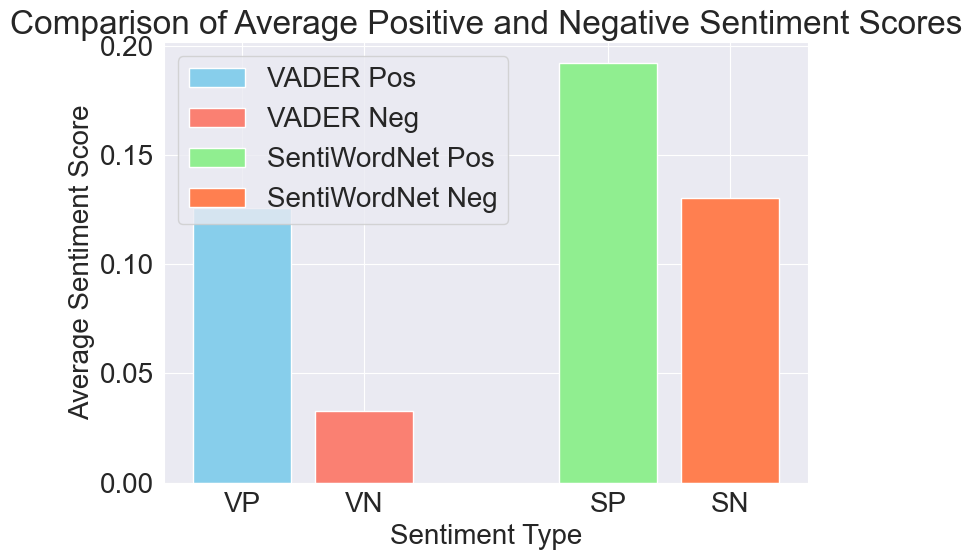

In [59]:
import matplotlib.pyplot as plt

# Calculate average VADER positive and negative sentiment scores
avg_vader_pos = sum(vader['pos'] for vader in df['vader_sentiment']) / len(df)
avg_vader_neg = sum(vader['neg'] for vader in df['vader_sentiment']) / len(df)

# Calculate average SentiWordNet positive and negative sentiment scores
avg_sentiwordnet_pos = sum(sentiwordnet['pos'] for sentiwordnet in df['sentiwordnet_sentiment']) / len(df)
avg_sentiwordnet_neg = sum(sentiwordnet['neg'] for sentiwordnet in df['sentiwordnet_sentiment']) / len(df)

# Plotting
plt.figure(figsize=(8, 6))

# VADER positive sentiment
plt.bar(x=[0], height=avg_vader_pos, width=0.4, color='skyblue', label='VADER Pos')

# VADER negative sentiment
plt.bar(x=[0.5], height=avg_vader_neg, width=0.4, color='salmon', label='VADER Neg')

# SentiWordNet positive sentiment
plt.bar(x=[1.5], height=avg_sentiwordnet_pos, width=0.4, color='lightgreen', label='SentiWordNet Pos')

# SentiWordNet negative sentiment
plt.bar(x=[2], height=avg_sentiwordnet_neg, width=0.4, color='coral', label='SentiWordNet Neg')

plt.title('Comparison of Average Positive and Negative Sentiment Scores')
plt.xlabel('Sentiment Type')
plt.ylabel('Average Sentiment Score')
plt.xticks([0, 0.5, 1.5, 2], ['VP', 'VN', 'SP', 'SN'])
plt.legend()
plt.tight_layout()
plt.show()

In [60]:
pip install textblob

Note: you may need to restart the kernel to use updated packages.


In [61]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import sentiwordnet as swn
from textblob import TextBlob

# Download necessary resources for NLTK
nltk.download('vader_lexicon')
nltk.download('sentiwordnet')



# Function to perform sentiment analysis with TextBlob
def analyze_sentiment_textblob(sentence):
    blob = TextBlob(sentence)
    polarity = blob.sentiment.polarity
    subjectivity = blob.sentiment.subjectivity
    return {'polarity': polarity, 'subjectivity': subjectivity}

for message in df['message']:
    vader_sentiment = analyze_sentiment_vader(message)
    sentiwordnet_sentiment = analyze_sentiment_sentiwordnet(message)
    textblob_sentiment = analyze_sentiment_textblob(message)

    print("Message:", message)
    print("VADER Sentiment:", vader_sentiment)
    print("SentiWordNet Sentiment:", sentiwordnet_sentiment)
    print("TextBlob Sentiment:", textblob_sentiment)
    print()

Message: Messages and calls are end-to-end encrypted. No one outside of this chat, not even WhatsApp, can read or listen to them. Tap to learn more. 
VADER Sentiment: {'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 1.25, 'obj': 16.375}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.275}

Message: Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻" 
VADER Sentiment: {'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.25}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 99871 38558 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\vidhu\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package sentiwordnet to
[nltk_data]     C:\Users\vidhu\AppData\Roaming\nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!


Message: +91 98709 38217 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 98702 02065 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 91370 44426 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 86559 19035 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob

Message: Anjali Kapoor joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.814, 'pos': 0.186, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 79770 56210 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 90499 38860 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 80801 39870 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob S

Message: +91 98204 33166 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 96896 27597 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 88988 92174 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 98676 12302 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob

Message: Ohk 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes you can but just use  printf("*"); 
VADER Sentiment: {'neg': 0.0, 'neu': 0.764, 'pos': 0.236, 'compound': 0.2144}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Arre ik 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Re 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Cool 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375

Message: #include <conio.h> #include <stdio.h>  void main() {     int i, j, l;     l = 5;      for (i = 0; i < 5; i++)     {         for (j = 0; j < l; j++)         {             printf("* ");         }          for (j = 0; j < 4 * i; j++)         {             printf(" ");         }          for (j = 0; j < l; j++)         {             printf("* ");         }          l--;          printf("\n");     }      l = 0;      for (i = 0; i < 5; i++)     {         for (j = l; j >= 0; j--)         {             printf("* ");         }          for (j = 4 * (5 - i) - 4; j > 0; j--)         {             printf(" ");         }          for (j = l; j >= 0; j--)         {             printf("* ");         }          l++;          printf("\n");     } } 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 51.0}
TextBlob Sentiment: {'polarity': 0.16666666666666666, 'subjectivity': 0.3333333333333333}

Message: you can ignore l

Message: # include <stdio.h> void main() {     for(int i=5; i>=-5; i--)     {         int t=abs(i);          for(int j=1; j<=t; j++)         printf("*");          for(int j=1; j<=(5-t)*2; j++)         printf(" ");          for(int j=t+1; j<=2*t ;j++)         printf("*");          printf("\n");     } } 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 11.0}
TextBlob Sentiment: {'polarity': 0.16666666666666666, 'subjectivity': 0.3333333333333333}

Message: This'll also do for that hollow diamond prog in c 
VADER Sentiment: {'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': -0.1, 'subjectivity': 0.05}

Message: Guys send code if possible for this problem 
VADER Sentiment: {'neg': 0.309, 'neu': 0.691, 'pos': 0.0, 'compound': -0.481}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 4.375}
TextBlob Sentime

Message: Ohk👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Learned something new 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.13636363636363635, 'subjectivity': 0.45454545454545453}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But I think the first statement in the for loop i.e(Before semi-colon)is for intialization ?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 8.625}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.3333333333

Message: Because it enters the loop because of k. And i gets printed too. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The condition of k becomes true and therefore it enters the loop. From 2 to 20 with a gap of 2. Therefore it enters 10 times and i gets printed instead from 1-10 
VADER Sentiment: {'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.125, 'obj': 20.625}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: So conclusion is If there are multiple conditions in a single ' for loop' then even if one statement is satisfied then loop will run for that condition. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.899, 'pos': 0.101, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 1.875, 'neg': 0.25, 'obj': 19.875}
TextBlob Sentiment: {'polarity': 0.142857

Message: ✌ 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: lol its automorphic my bad i have written autophoric😂😂 
VADER Sentiment: {'neg': 0.285, 'neu': 0.488, 'pos': 0.228, 'compound': -0.1779}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.875, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0500000000000001, 'subjectivity': 0.6833333333333333}

Message: ignore the comments🥺 
VADER Se

Message: This is because 52 (i.e. 25) might be stored as 24.9999999 or 25.0000000001 because the return type is double. When assigned to int, 25.0000000001 becomes 25 but 24.9999999 will give output 24. To overcome this and output the accurate answer in integer format, we can add 0.5 to the result and typecast it to int e.g (int)(pow(5, 2)+0.5) will give the correct answer(25, in above example), irrespective of the compiler. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 2.625, 'neg': 1.375, 'obj': 41.0}
TextBlob Sentiment: {'polarity': 0.13333333333333336, 'subjectivity': 0.24444444444444446}

Message: Nai! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I h'v read it on some blog 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 

Message: Can someone pls add her to the group?👆🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 3.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Done 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: Saket (TSEC, CS) added +91 77180 43697 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Samay Raina changed this group's settings to allow only admins to edit th

Message: Ohk 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 

Message: just check please 
VADER Sentiment: {'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Please don't delete the messages let others learn from mistakes 
VADE

Message: Dil pe le liya isne😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Try this one 👆 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: #include <iostream> using namespace std;  int main() { 	int n, m, supplyDrops = 0; 	cin >> n >> m; 	supplyDrops = (n + n % 2)*(m + m % 2) / 4; 	cout << supplyDrops; 	cin.get(); } 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 15.875}
TextBlob Se

Message: Can someone help me setup the Build Task for C++ in VSCODE 
VADER Sentiment: {'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 7.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Need Urgent Assistance 
VADER Sentiment: {'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.2023}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: As far as I know signed int data type has a range of -32767 to 32767. After i becomes 32767 it will not be incremented to 32768 rather it will jump on the extreme left of the assigned range that is -32767 and hence the loop continues ... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.75, 'neg': 1.25, 'obj': 28.0}
TextBlob Sentiment: {'polarity': -0.008333333333333331, 'subjectivity': 0.6666666666666666}

Message: See range 

Message: @919920860128 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Samay Raina added +91 93244 89490 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentimen

Message: Code chef is way more professional than hacker rank ... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 7.5}
TextBlob Sentiment: {'polarity': -0.0666666666666667, 'subjectivity': 0.5}

Message: Exactly 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.25}

Message: U must have some experience to crack the code 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 6.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: exactly 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.25}

Message: I know @918247578176  is a way bett

Message: there they recommended this youtube playlist 
VADER Sentiment: {'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.2023}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.youtube.com/playlist?list=PLDN4rrl48XKpZkf03iYFl-O29szjTrs_O 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: For us beginners 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ty 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍🏻 
VADER Sentiment: {'neg': 0.0, 'ne

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Also, I don't think that you need is_zero. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 4.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: H variable nhi aayega input me 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This one 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sussutu is a world-renowned magician. And recently, he was blessed with the power to remove EXACTLY ONE element from an array.  Given, an array A (index starting from 0) with N elements. Now, Sussutu CAN remove only that element which makes the sum of ALL the remaining elements exactly divisible by 7.  Throughout his life, Sussutu was so busy with magic that he could never get along with maths. Your task is to help Sussutu find the first array index of the smallest element he CAN remove.     *Input:*  The first line contains a single integer N.  Next line contains N space sep

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: When i was a FE no one even knew what is competitive coding 
VADER Sentiment: {'neg': 0.171, 'neu': 0.698, 'pos': 0.132, 'compound': -0.128}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 10.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You guys have started pretty early 
VADER Sentiment: {'neg': 0.0, 'neu': 0.61, 'pos': 0.39, 'compound': 0.4939}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.125, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.175, 'subjectivity': 0.65}

Message: The reason i said Dheeraj to add me to this group is ICPC 
VADER Sen

Message: @917506412914  @917700027264 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Saurav Uppor Tsec.vcf (file attached) 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @917700027264 Is also a SE It Student 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Add him too 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.375, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Alright 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Woah Thats impressive 
VADER Sentiment: {'neg': 0.0, 'neu': 0.377, 'pos': 0.623, 'compound': 0.5106}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 1.0}

Message: Yeah! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3595}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: That's why i recommend FEs to just practice and not go to college 
VADER Sentiment: {'neg': 0.0, 'neu': 0.815, 'pos': 0.185, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.875, 'obj': 7.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: We need that kind of dedication 
VADER Sentiment: {'ne

Message: She's one of the teachers 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Comps ppl are lucky We got Chumki maam and Rita maam 
VADER Sentiment: {'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 0.3333333333333333, 'subjectivity': 0.8333333333333334}

Message: Chumki maam is best 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.6369}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.125, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.3}

Message: yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sort 
VADER Sentiment: 

Message: And we discuss the challenge at 10 PM 
VADER Sentiment: {'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Like you won't use linked list in cp 
VADER Sentiment: {'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Should we start learning python now? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You can 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: And any front end languages? 
VADER Sent

Message: Sem 2 kinda hectic 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.375, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: So not coding much these days 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.75, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: Which branch? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But the thing is if they learn Python at this stage then they won’t be interested in learning Java at all which might lead to them performing poorly in their practical exam which is gonna affect their pointer 
VADER Sentiment: {'neg': 0.0, 'neu': 0.912, 'pos': 0.088, 'compound': 0.5499}
SentiWordNet Sentiment: 

Message: Unfortunately we have PTs at that time 
VADER Sentiment: {'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.875, 'obj': 4.125}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 1.0}

Message: In codecell but will say this is a good opp for FES 
VADER Sentiment: {'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.5927}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.125, 'obj': 6.875}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: FROM 8 15 TO 9 45 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: PT 
VADER Sentiment: {'neg': 0

Message: And then PCE waale teachers literally threatening 
VADER Sentiment: {'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'compound': -0.5267}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 3.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thats fine 
VADER Sentiment: {'neg': 0.0, 'neu': 0.357, 'pos': 0.643, 'compound': 0.2023}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.4166666666666667, 'subjectivity': 0.5}

Message: yall have project in AP? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But that drawing wala bs 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah 
VADER Sentiment: {'neg': 0.0

Message: This fails if number of elements is large , say 10^8 
VADER Sentiment: {'neg': 0.231, 'neu': 0.661, 'pos': 0.107, 'compound': -0.3612}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 1.0, 'obj': 4.625}
TextBlob Sentiment: {'polarity': -0.14285714285714285, 'subjectivity': 0.36428571428571427}

Message: Time limit exceeded aayega 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ab ye samjh ke bahar jaa raha hai😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Chill, workshop me we'll to teach this stuff 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 4.625}
TextBlob Sentiment: {'polarity': 0.0

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Guys  Kunal is a BE 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Codecell senior committee member 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hello Kunal Welcome to the group 
VADER Sentiment: {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.4588}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.9}

Message: We are FE students  We need your help and guidance for CP and Dev w

Message: Is functions taught by thampi ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thampi sir* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same question 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: Can we use power function for tomorrow's PT? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'comp

Message: In one team 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes. Everyone has their own roles. Some might overlap... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.5, 'obj': 5.875}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Ohk 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: It's either web dev or web dev + AI/blockchain 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0

Message: At condition 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You have done n-i 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bhai voh galat nhi hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: More efficient program? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.393, 'pos': 0.607, 'compound': 0.4754}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.375, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentime

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🙌🙌 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kafi kuch hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.

Message: for(i=0;i<length-1;i++)         {             flag=1;             for(j=0;j<length-i-1;j++)             {                 if(a[j] > a[j+1])                 {                     temp=a[j];                     a[j]=a[j+1];                     a[j+1]=temp;                     flag=0;                 }                 if(flag==1) break;             }         } 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 10.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: #include<stdio.h> void main() {     int row,i,spaces,value=1;     for(spaces=10,row=1;row<=5;row++,spaces--)     {         for(i=1;i<spaces;i++)             printf("  ");                  for(i=1;i<row;i++)         {             printf(" %d",value);             value++;         }         printf("\n");     } } 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg':

Message: +91 77383 38799 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 84519 72252 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 93078 63220 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 97739 65140 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob

Message: Before 11 invite ho jayega 
VADER Sentiment: {'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Message copy paste karna 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'n

Message: all the best 
VADER Sentiment: {'neg': 0.0, 'neu': 0.323, 'pos': 0.677, 'compound': 0.6369}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.3}

Message: From where do we upload the code?, 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: side mein option hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: For c lang in code Blocks its GNU GCC C11 5.1.0 right??? 
VADER Sentiment: {'neg': 0.196, 'neu': 0.804, 'pos': 0.0, 'compound': -0.3485}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 7.0}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: Hey We c

Message: Ohh🤔 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Saket (TSEC, CS) changed the group description 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: send the code 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Happy to make my first correct submission 😁😃😃😁 
VADER Sentiment: {'neg': 0.0, 'neu': 0.654, 'p

Message: Ty @919689727471 
VADER Sentiment: {'neg': 0.0, 'neu': 0.278, 'pos': 0.722, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ty @918408867834 
VADER Sentiment: {'neg': 0.0, 'neu': 0.278, 'pos': 0.722, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Deadlock 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.375, 'obj': 0.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks mahn 
VADER Sentiment: {'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 

Message: At least pls keep the mashup every week 
VADER Sentiment: {'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': -0.3, 'subjectivity': 0.4}

Message: but atleast discussion 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Upsolve after the contest. That'd be more helpful. Yall can discuss in class too about your approach 
VADER Sentiment: {'neg': 0.0, 'neu': 0.838, 'pos': 0.162, 'compound': 0.4754}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 11.125}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Pls 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Messag

Message: This isnt allowed during the contest 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: codeforces ke compiler pe try kar 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: maybe your way of printing op is wrong 
VADER Sentiment: {'neg': 0.307, 'neu': 0.693, 'pos': 0.0, 'c

Message: Screw these subjects man 
VADER Sentiment: {'neg': 0.318, 'neu': 0.682, 'pos': 0.0, 'compound': -0.1027}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I guess 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: sure bro ... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 0.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.8888888888888888}

Message: ☝️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'po

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 97571 15289 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.youtube.com/watch?v=pKO9UjSeLew 
VADER Sentiment: {'neg': 0.0, 'neu'

Message: Are you talking about Firebase workshop at Fr. Agnel? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 6.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Google assistant and cloud wala at tsec 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hua tha bhai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound':

Message: Koi part le raha hai??😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Will y'all be going for that 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Vohi😂😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🙌 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🥺 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj':

Message: Koi nahi bhai Lets drop it 
VADER Sentiment: {'neg': 0.296, 'neu': 0.704, 'pos': 0.0, 'compound': -0.2732}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ill send in a challenge in a few mins 
VADER Sentiment: {'neg': 0.308, 'neu': 0.549, 'pos': 0.143, 'compound': -0.3612}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.75, 'obj': 7.625}
TextBlob Sentiment: {'polarity': -0.35, 'subjectivity': 0.55}

Message: K 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Lets all get to it 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Message: 😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂😂 koi itna vella nhi hoga 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bro you have no idea 
VADER Sentiment: {'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But seriously kisko codingninja ko ddos karna hai 
VADER Sentiment: {'neg': 0.227, 'neu': 0.773, 'pos': 0.0, 'compound': -0.2617}
Sent

Message: Haa 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Subah karte hai ise 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😐👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Oh bhaiya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
Te

Message: Ok theek hai👍👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: and sunday sirf 2 hours toh de hi sakte ho 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: and waise bhi PT hai toh kya tension 
VADER Sentiment: {'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.3182}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Usme bhi pass honeka wande hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: come on yaar copy karle bhai 
VADER Sentime

Message: Revise as in discuss? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nahi Bhai PT purpose! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Arre ha pt bhi hai 
VADER Sentiment: {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But 2hr hi hai na mashup toh morning me rakh sakte hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Then pt ka kar sakte hai 
VADER Sentiment: {'neg': 0.0, 'neu

Message: Not giving😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Chal dekhta hu 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, '

Message: Thank you seniors for this wonderful exposure to competitive programming you all have given to us..... @919689727471  @918408867834  @917208176024 
VADER Sentiment: {'neg': 0.0, 'neu': 0.651, 'pos': 0.349, 'compound': 0.8213}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.25, 'obj': 9.0}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 1.0}

Message: Yaa truly 
VADER Sentiment: {'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thank you! Many more exciting workshops coming up! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.477, 'pos': 0.523, 'compound': 0.7634}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 6.375}
TextBlob Sentiment: {'polarity': 0.4583333333333333, 'subjectivity': 0.6}

Message: We are excited for those.. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.34}
SentiWordNet Sentiment: {'

Message: Let's go guys.. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: All the best! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.308, 'pos': 0.692, 'compound': 0.6696}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.3}

Message: btw yall would be able to see mashup standings this time 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 4.75}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.625}

Message: I missed yaar 
VADER Sentiment: {'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😢😢 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'c

Message: 1st one or 2nd? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 1st 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mai dono mai daal diya😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: When is it 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Tomorrow. 8:05 pm. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, '

Message: Ohhh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: No problem. 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.5994}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.875, 'obj': 1.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://codeforces.com/blog/entry/74493 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment

Message: Use map<int,int> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: O(N) me ho jayega 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hash map na?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Can u explain 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, '

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: -2 hua rating isme :( 
VADER Sentiment: {'neg': 0.42, 'neu': 0.58, 'pos': 0.0, 'compound': -0.4404}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': -0.75, 'subjectivity': 1.0}

Message: I found it tough 
VADER Sentiment: {'neg': 0.429, 'neu': 0.571, 'pos': 0.0, 'compound': -0.128}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': -0.3888888888888889, 'subjectivity': 0.8333333333333334}

Message: Div 2 tha... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compou

Message: I think you meant Visual Studio. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Or, VS Code is a good lightweight alternative. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.674, 'pos': 0.326, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.25, 'obj': 7.0}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: Sir🙏😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: VSCode very good 
VADER Sentiment: {'neg': 0.0, 'neu': 0.385, 'pos': 0.615, 'compound': 0.4927}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.9099999999999999, 'subjectivity': 0.7800000000000001}

Message: 
VADER Sentiment: {'neg':

Message: which data structure u used? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: map 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: same 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: toh kya prblem hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: resolved thanks to @918408867834 
VADER Sentiment: {'neg': 0.0, 'neu': 0.303, 'pos': 0.697, 'compound': 0.5574}
SentiWordNet Senti

Message: Karna kya hai?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kya karna hai?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What's the op 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Code segment jo diya hai uska o/p batao 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mcq question hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'

Message: Point hai Workshop is much more important 
VADER Sentiment: {'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.2716}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.25, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.45, 'subjectivity': 0.75}

Message: I don't know  Let's see 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: *Reminder* This starts in some time. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Janvi Rathod changed the group description 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER

Message: What is it? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Aacha @senoirs if we register n kn kiya toh rank kum hoga?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': -0.8, 'subjectivity': 0.9}

Message: Like login bhi nhi kiya 
VADER Sentiment: {'neg': 0.0, 'neu': 0.615, 'pos': 0.385, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nahi 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Even if you login toh bhi kuch nahi hoga 
VADER Sentiment: {'neg': 0.0,

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Try this one 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.geeksforgeeks.org/magic-square/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: If you don't get after trying then refer 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://coderinme.com/forming-a-magic-square-hackerrank-problem-s

Message: Maybe yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Codecell's Intro to CP and Git Workshop cancelled due to virus scare! 
VADER Sentiment: {'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.6696}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 6.625}
TextBlob Sentiment: {'polarity': -0.15625, 'subjectivity': 0.375}

Message: 🤦‍♂🤦‍♂🙄 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Matlab sab cancel hoga par college mein lectures nhi 
VADER Sentiment: {'neg': 0.2, 'neu': 0.8, 'pos': 0.0, 'compound': -0.25}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Canceled or postpone

Message: I mean how do I include a user defined file in another file using #include "" 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.25, 'obj': 13.25}
TextBlob Sentiment: {'polarity': -0.3125, 'subjectivity': 0.6875}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This is the error 
VADER Sentiment: {'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thks a lot for rescheduling the time ✌️ 
VADER Sentiment: {'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: First keep that process in a

Message: ^ 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ty 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: aaj kafi hard nahi hai?? 
VADER Sentiment: {'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.1926}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.75, 'obj': 0.25}
TextBlob Sentiment: {'polarity': -0.2916666666666667, 'subjectivity': 0.5416666666666666}

Message: Can someone send all questions of today's mashup on the group? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 7.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: div 3 he h 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'p

Message: A friend 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4939}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: from india 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Or kuch info milega?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: . 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob 

Message: Nhi bhai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Abhi toh ds or algo bhi nhi aata hai aache se 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Acha ab smjha iska mtlb 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://youtu.be/s6LrBex9NPA 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://youtu.be/mUxS-35qO44 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.

Message: Please make sure u watch this video only after u have started with C++ and covered a large topics on it  Otherwise trees linked list all this things might become confusing for u.  But if ur in Second year ofcourse DSA has been covered in college so u should try to get comfortable with c++ within 2-3 weeks if u dont know c++ and then u can follow that with DSA 
VADER Sentiment: {'neg': 0.021, 'neu': 0.869, 'pos': 0.11, 'compound': 0.743}
SentiWordNet Sentiment: {'pos': 3.0, 'neg': 2.125, 'obj': 44.875}
TextBlob Sentiment: {'polarity': 0.1357142857142857, 'subjectivity': 0.5862433862433862}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: About courses  I will tell u bit later 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 7.75}
TextBlob Sen

Message: Are try it out na 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ha vahi karunga 
VADER Sentiment: {'neg': 0.0, 'neu': 0.455, 'pos': 0.545, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Do it and tell us! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I say itll output -1... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: -65😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentim

Message: This is called an *implicit* call. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.25, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It internally calls ```Object()```. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentime

Message: Hmm 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Btw can you share your GitHub? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://summerofcode.withgoogle.com/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: https://m.timesofindia.com/home/education/news/stronger-foundation-for-a-substantial-career-engin

Message: At 10 pm tonight, whatever is the poll result we'll proceed with it. So vote if you haven't yet ! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 13.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kya karna hai? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Aur 15 minute ruke? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nope 
VADER Sentiment: {'neg': 0.0

Message: Wtf there's one more periodic table to deal with in studies 
VADER Sentiment: {'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.5859}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 7.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.75}

Message: :/ 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.34}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': -0.25, 'subjectivity': 1.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'ob

Message: dont think so 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It says runtime error on test 1 
VADER Sentiment: {'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.625, 'obj': 5.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Its working perfectly fine in my compiler 
VADER Sentiment: {'neg': 0.0, 'neu': 0.455, 'pos': 0.545, 'compound': 0.7184}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.125, 'obj': 5.375}
TextBlob Sentiment: {'polarity': 0.4166666666666667, 'subjectivity': 0.5}

Message: it showed me the same 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: i used long long for everything 

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bhai 1st wala c mein try karta 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Here 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Anyone who writes the code in python? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Senti

Message: First calc freq of each number. Then making smaller grps by diving till 2 (the inner for loop) and placing it in max heap. And taking k elements from top of the max heap 
VADER Sentiment: {'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.875, 'obj': 21.75}
TextBlob Sentiment: {'polarity': 0.1875, 'subjectivity': 0.375}

Message: Do dry run and see whats happening 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': -0.06666666666666665, 'subjectivity': 0.6}

Message: Welcome to the group Palak! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'compound': 0.5093}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.9}

Message: Thanks mate! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.239, 'pos': 0.761, 'compound': 0.4926}
SentiWordNet Senti

VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Try it on hackerrank @917738557601 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.geeksforgeeks.org/java-tricks-competitive-programming-java-8/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Q name? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Super Reduced string 
VADER Sentiment: {'neg': 0.0, 'neu': 0.339, 'pos': 0.661, 'c

Message: He meant Sick of being at home 😂 
VADER Sentiment: {'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.5106}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': -0.7142857142857143, 'subjectivity': 0.8571428571428571}

Message: We are Home sick 
VADER Sentiment: {'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.5106}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': -0.7142857142857143, 'subjectivity': 0.8571428571428571}

Message: Correction 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Anyways  Its heaven time for Introverts 😉✌🏻 
VA

Message: Goes without saying, Sherlock nahi dekha toh what are you doing w ur life 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 💯💯💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +1 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Almost everyone has seen that ig 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWor

Message: 😂😂😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Lmao 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5994}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Aadat ho jayegi ghar pe baithne ki... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bruh fr 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mere jese extrovert toh maar jayenge 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: 

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Waiting for this message 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Euclid' GCD Extended Euclidean Prime Factorization   Sem 6 mein hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But code nahi hai na 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'po

Message: Same 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: Plz don't tell me 
VADER Sentiment: {'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Internshala has launched 'The Grand summer internship fair'  An online fair where you can search and apply to over 1700+ internships, both work from home and in-office. Companies like OnePlus, Capgemini, Xiaomi, HCL, TVS, TikTok are hiring interns with a maximum stipend of up to INR 75,000. So hurry up and register here for free - https://internshala.com/i/RC-ISP17VISH9082 
VADER Sentiment: {'neg': 0.0, 'neu': 0.767, 'pos': 0.233, 'compound': 0.9169}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 34.5}
TextBlob Sentiment: {'polarity': 0

Message: Grading students:- hackerrank 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: semi colon after if? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: send the whole code and ques 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.4}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: send the main function 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound

Message: U bet 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Just facts 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 💯💯💯💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👌👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment:

Message: 2-5 it is 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}


Message: Many boundary cases 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: https://youtu.be/cpguolx2oms 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Guysss 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Check this out 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://realcodevengers.github.io/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Senti

Message: i had found this soln online it was good 
VADER Sentiment: {'neg': 0.0, 'neu': 0.707, 'pos': 0.293, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 6.25}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: This makes it much easier 
VADER Sentiment: {'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.375, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: Ig upper_bound will make it much simpler 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.5, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: No, upper bound returns an iterator to the value just greater than X.   Lower bound returns an iterator to the value NOT LESS THAN 'X'. Means lower bound will return an iterator to the value if value is present the array . While upper bo

Message: *2 Months of Netflix Premium Free at no cost For REASON OF QUARANTINE (CORONA VIRUS)* Get 2 Months of Netflix Premium Free anywhere in the world for 60 days. Get it now HERE https://bit.ly/2wOYD1B 
VADER Sentiment: {'neg': 0.057, 'neu': 0.773, 'pos': 0.17, 'compound': 0.6597}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.5, 'obj': 25.5}
TextBlob Sentiment: {'polarity': 0.4, 'subjectivity': 0.8}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mithun Kapoor removed +91 72762 35231 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 3 times in a row?¿¡! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 

Message: Chalta hein 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yup 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Code jam qualification rd tomorrow! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sanyog Sharma added +91 79775 35465 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Codeforces Div 2 @ 8pm today Atcoder beginner contest 161 @ 5.30pm tomorrow April Long challenge started@ 3

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}



Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @917977535465 Check your handle, its incorrect 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.75, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'

Message: can any1 explain why are using (String) in the above code? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 8.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: (String) is not required😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah figured it out 
VADER Sentiment: {'neg': 0.0, 'neu': 0.577, 'pos': 0.423, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But when is it required then 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.375, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I mean its a non-primitive data ty

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Do you practice in jupyter or pycharm 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I’m not able to open the exercises in pycharm 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.625, 'obj': 6.25}
TextBlob Sentiment: {'polarity': -0.125, 'subjectivity': 0.5625}

Message: In the question they consider the indexes from 0 or 1? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 6.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: That same 

Message: Usually, interfaces are used to provide INDEPENDENT functionality. Like the ```Iterator``` interface allows objects to be iterated over, and the ```Runnable``` interface allows processes to run in a separate thread. You can have a class that is both iterable, and can run in a separate thread. Interfaces are for things that applicable to a broad range of objects different objects.  Classes provide MUTUALLY EXCLUSIVE functionality. Like, if you have a ```Stack`` class and a ```Queue``` class. There is no point in creating a ``StackQueue``` class. 
VADER Sentiment: {'neg': 0.026, 'neu': 0.863, 'pos': 0.111, 'compound': 0.7378}
SentiWordNet Sentiment: {'pos': 3.25, 'neg': 0.625, 'obj': 61.125}
TextBlob Sentiment: {'polarity': -0.046875, 'subjectivity': 0.321875}

Message: Yeah makes sense Thank you 
VADER Sentiment: {'neg': 0.0, 'neu': 0.39, 'pos': 0.61, 'compound': 0.5719}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 0.0, 'subj

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Should i extend contest or something? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.702, 'pos': 0.298, 'compound': 0.1779}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: In queue from a long time!! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.375, 'obj': 4.25}
TextBlob Sentiment: {'polarity': -0.078125, 'subjectivity': 0.4}

Message: extension plij 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I logged out by mistakely can’t even log in again 😂 
VADER Sentiment: {'neg': 0.0, 'ne

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: why is this faster ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: could u submit ans and was it accepted? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 5.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes. It was accepted. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.294, 'pos': 0.706, 'compound': 0.5859}
SentiWordNet Sentim

Message: In queue for Long too!! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.625, 'obj': 2.875}
TextBlob Sentiment: {'polarity': -0.078125, 'subjectivity': 0.4}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob 

Message: See* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: William lin , Errichto , Ashish Gupta, Rahul Dugar , Um_Nik, Bohdan Pryshchenko  These guys are some of the best coders and they write beautiful and short solutions to complex problems.  And these guys have practiced a lot! More than 2k cp questions till now.   Have a look at their Codeforces account to get inspired. Checkout their stopstalk profiles too. 
VADER Sentiment: {'neg': 0.041, 'neu': 0.758, 'pos': 0.201, 'compound': 0.8908}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 1.125, 'obj': 28.5}
TextBlob Sentiment: {'polarity': 0.395, 'subjectivity': 0.5}

Message: Add rooppus to the list 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 1.25}
TextBlob Sentiment: {'polarity': 0.0, 'subject

Message: BFS+DFS + Terrible Implementation 
VADER Sentiment: {'neg': 0.608, 'neu': 0.392, 'pos': 0.0, 'compound': -0.4767}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 1.375}
TextBlob Sentiment: {'polarity': -1.0, 'subjectivity': 1.0}

Message: woaah 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: double dfs 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I gave up man 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: didnt participate today? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWor

Message: Woww broo..it looks so good.. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 3.5}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🙌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: Good going Dheeraj! Looks great! 🙌🏻 @918451904417 
VADER Sentiment: {'neg': 0.0, 'neu': 0.397, 'pos': 0.603, 'compound': 0.8217}
Se

Message: 👌👌👌💯💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thank you Pratik! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.4199}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: its very nice👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.3}

Message: Its like when you see a pro Build something! If MFA 
VADER Sentiment: {'neg': 0.0, 'neu': 0.763, 'pos': 0.237, 'compound': 0.4199}
SentiWordNet S

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohk ty @917304357388 
VADER Sentiment: {'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: codejam 4pm or 9.30pm 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 9:30 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentimen

Message: Second wala dekha? Kaafi interesting tha 
VADER Sentiment: {'neg': 0.0, 'neu': 0.649, 'pos': 0.351, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.25}

Message: Nahi😞 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Aaj subah padha 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Still doing 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos'

Message: Mera ek hi hua😓 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @918830526885 D ka TC kya tha tere approach ka 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: np upsolve next one... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Pehle waale mai tle mila coz I used brute force,what wqs the approach @918408867834 ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: me

Message: Thanks bhai 
VADER Sentiment: {'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: 🙌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Also follow this guy on insta and YouTube Pretty good content! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.585, 'pos': 0.415, 'compound': 0.75}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.125, 'obj': 5.5}
TextBlob Sentiment: {'polarity': 0.5625, 'subjectivity': 0.8}

Message: Sure 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 0.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.8888888888888888}

Message: Thank you Rishab! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 

Message: Bhaiii 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What are the chances they will promote us directly? 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.614, 'pos': 0.386, 'compound': 0.5267}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 5.25}
TextBlob Sentiment: {'polarity': 0.1, 'subjectivity': 0.4}

Message: Sach mw 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: India Up For Another Lockdown Extension For 70 days? Expert Suggests https://ourbitcoinnews.com/global-expert-warns-lockdown-will-be-bad-in-india-if-it-is-less-than-10-weeks/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 9.875}
TextBlo

Message: Be ready for the Mashup tomorrow(3 pm - 5 pm) 
VADER Sentiment: {'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 6.75}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.5}

Message: Registration link will be sent tomorrow at 10 am 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 8.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Just click on the link and register that's it 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 5.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohk No need to Append names? 
VADER Sentiment: {'neg': 0.306, 'neu': 0.694, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 3.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 

Message: For those who could'nt solve 3rd q. (CC lunch) 
VADER Sentiment: {'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'compound': 0.2023}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Imagine always there for help with that! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.4574}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.5, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: PNC* xP 
VADER Sentiment: {'neg': 0.0, 'neu': 0.278, 'pos': 0.722, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Imagine? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.5, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Im* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

Message: I use Windows 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok Ill download CLion 
VADER Sentiment: {'neg': 0.4, 'neu': 0.286, 'pos': 0.314, 'compound': -0.1531}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.75}

Message: It is free only for 30 days? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.5106}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.9}

Message: Apply for student's license 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok If you can send a link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.6

Message: In this extension page you will find extension 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 5.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Docs* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Call me if you need any help 
VADER Sentiment: {'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 4.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: https://www.youtube.com/watch?v=DIw02CaEusY 
VADER Sentiment: {'neg': 0.0, 'neu': 1.

Message: Please just tell me how do I set the include pathaa 
VADER Sentiment: {'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.0, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Path 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: In VSCode 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thats all that is remaining 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Type "env" in search box. Then click on "Edit system variables" 
VADER S

Message: It all begins with a hello world. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: then you explore further 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: then arrays come 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: sorting searching 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: functions 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
S

Message: Hey everyone, I would like to share with you something that I have been working with for almost 2 months now. In search for efficient medical imaging and diagnosis methods for COVID-19, I worked with radiologists at arterys.com to come up with AI based solutions for faster diagnostic methods. The challenge was to recognise early symptoms of the virus on PA Chest X-rays (since CT scans aren't always available) taken from varying hospitals across the US, China and Italy. After extensive research with pretrained and custom models, an ensembled version of both worked well for my case of Opacity detection. This will act as a first stage diagnosis for upcoming pneumonia-like symptoms in patients. The patient will be then advised to get a PCR test done for final confirmation, thereby saving testing kits and securing lives of radiologists who might come in contact with the virus Today I am sharing my repository with all of you to help spread the message about it. I would also like to 

Message: Have a look at this☝️🤯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://hownot2code.com/2016/09/02/a-space-error-370-million-for-an-integer-overflow/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🤯 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: God damn. 
VADER Sentiment: {'neg': 0.562, 'neu': 0.0, 'pos': 0.437, 'compound': -0.1531}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 

Message: 👌👌👌👌 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: where do we find the hidden test cases? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 4.125}
TextBlob Sentiment: {'polarity': -0.16666666666666666, 'subjectivity': 0.3333333333333333}

Message: Ha vo window ka size haina 
VADER Sentiment: {'neg': 0.0, 'neu': 0.676, 'pos': 0.324, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 3.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Just search for the same q. but this time dont click on aur mashup link 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Me

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ikr,but is it true that he copied? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.375, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: Yeah. It is. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Like always? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.286, 'pos': 0.714, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: He is better at cp than most of us 
VADER Sentiment: {'neg': 0.0, 'neu': 0.734, 'pos': 0.

Message: I had a question for seniors..... Like how much DS do you need to learn before starting with Algorithms? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.865, 'pos': 0.135, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.5, 'obj': 12.75}
TextBlob Sentiment: {'polarity': 0.1, 'subjectivity': 0.15000000000000002}

Message: Only Arrays 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: Ohk ty 
VADER Sentiment: {'neg': 0.0, 'neu': 0.278, 'pos': 0.722, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Similar question

Message: Let's do this together 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You all can make your own plans 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: I'll help you with Codechef questions if you get stuck 
VADER Sentiment: {'neg': 0.157, 'neu': 0.63, 'pos': 0.213, 'compound': 0.1779}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks  I appreciate that 
VADER Sentiment: {'neg': 0.0, 'neu': 0.152, 'pos': 0.848, 'compound': 0.6808}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: For JavaScript i g

Message: Dude sameee 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I had goofed up in chem 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sameee 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes... Jisme bhot kharab marks aye the😭 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Are yaar aaj enjoy karo 
VADER Sentiment: {'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.4939}

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Once we attended some workshop and nevey got attendance for it 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 6.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: End mein mila 🤦🏻‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Oh mai tabhi college attend nahi kiya hoga 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'p

Message: Waise bhi engineers hai bro😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: hahah 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob S

Message: To-do's aren't saved!!? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.625, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Over all, the design of the application looks good. But when the app is restarted, all the to-do's are lost. 
VADER Sentiment: {'neg': 0.129, 'neu': 0.786, 'pos': 0.085, 'compound': -0.25}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.75, 'obj': 11.5}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: I havent used the database 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 

Message: but what about ppl who dont have it 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ```pip install pygame``` 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: arre leave this try it and tell me na😂 
VADER Sentiment: {'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compound': -0.0516}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: When I exit the program, I get an error. 
VADER Sentiment

Message: Analogy^ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The caret symbol (^)? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Analogy^ Test Abc 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Tf 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 

Message: Thank you👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.286, 'pos': 0.714, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Anyone giving Cf round ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': -0.2, 'subjectivity': 0.4}

Message: Any idea about B ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: *Problem*  We have been given a string array . We need to find which word PM Modi has said and how much times. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.625, 'neg': 1.125, 'obj': 12.25}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Mes

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: For free certificates 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.377, 'pos': 0.623, 'compound': 0.5106}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.4, 'subjectivity': 0.8}

Message: 3 lines using Flexbox. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlo

Message: Check out my portfolio https://gauravraj0510.github.io/My-Portfolio/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Too good 
VADER Sentiment: {'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 1.125}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: 👍👍nicely styled 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍🏻👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Amazing! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0,

Message: Any1 appearing for the quiz?😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Velle he hai tp karlete hau 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: C programming revise karna padega🤔 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Voh revise kon karta hai😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 

Message: All submissions and test cases are now visible. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 6.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.topcoder.com/thrive/articles/List%20of%20awesome%20learning%20resources 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hope this helps!! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.141, 'pos': 0.859, 'compound': 0.7256}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 1.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Cov

Message: 😅😂😂😂🤣🤣🤣 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: True 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: Relatable 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://twitter.com/craigdennis90/status/1262821209764507648?s=09 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet 

Message: Yeah same 
VADER Sentiment: {'neg': 0.0, 'neu': 0.312, 'pos': 0.688, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Are you actually asking for the unit test results or Like referencing the joke 🙈😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.5719}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 9.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: Lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: Dheeeerajjj 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 

Message: It took in  Email & DOB & Full name And generated a password for you 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 9.0}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.55}

Message: Which was LastnameDOB 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I was sooo foolish! 
VADER Sentiment: {'neg': 0.545, 'neu': 0.455, 'pos': 0.0, 'compound': -0.3382}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Password generator bana rahe ho😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same here 
VADER Sent

Message: https://twitter.com/theEmcon/status/1264676869481398280?s=20 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Following video tutorials on coding!!! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://youtu.be/pZwFizZUbzU 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compo

Message: Smart! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4574}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.26785714285714285, 'subjectivity': 0.6428571428571429}

Message: Agreed 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But I feel that the only time you should be using libraries is for prototypes, never for the final version of an app/website. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 1.25, 'obj': 12.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: This way, you aren't really using the library, but you also are ...... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 

Message: Bootstrap handles it all na? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I try to avoid BootStrap alltogether. 
VADER Sentiment: {'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Try CSS Grid. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohh that is absolute beauty  ..... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.568, 'pos': 0.432, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.375, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.9}

Message: I've used it .... 
VADER Sentiment: {'neg': 0.0,

Message: Yeah.... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Well, it looks like a solid color. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.326, 'pos': 0.674, 'compound': 0.6369}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 6.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: Wait 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Which one are you talking about? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I'm talking about this one.... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 

Message: For all the students of *Thadomal Shahani Engineering College*, look what ‘Summer Interns of 2020' campaign has to offer -  🤩 27,500+ work from home internship openings in brands like CodeChef, HCL, Sportskeeda, and many more 😎 Internships in profiles like marketing, web development, and more 💸 All internships come with a guaranteed stipend and you can earn up to ₹1.8 lacs! 🥳 Chance to win early entry pass and rewards up to ₹10,000  So, let’s become the Summer Interns of 2020! Hurry up, register now- https://internshala.com/summer-interns-of-2020?utm_source=refer_whatsapp&utm_medium=5870874 
VADER Sentiment: {'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.9258}
SentiWordNet Sentiment: {'pos': 1.75, 'neg': 0.0, 'obj': 52.25}
TextBlob Sentiment: {'polarity': 0.51, 'subjectivity': 0.43999999999999995}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, '

Message: Damn, this is unique!  What are your thoughts @919689727471 and @918408867834? 
VADER Sentiment: {'neg': 0.23, 'neu': 0.77, 'pos': 0.0, 'compound': -0.4574}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.25, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.46875, 'subjectivity': 1.0}

Message: I would suggest spending at least 30 minutes on each problem. 
VADER Sentiment: {'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 9.375}
TextBlob Sentiment: {'polarity': -0.3, 'subjectivity': 0.4}

Message: But otherwise, this is great advice. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.469, 'pos': 0.531, 'compound': 0.7684}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.75}

Message: Hmm..... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity

Message: Damn 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +100 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😭😭😭 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: We are somewhat blessed with Rita 
VADER Sentiment: {'neg': 0.0, 'neu': 0.581, 'pos': 0.419, 'compound': 0.5584}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah man No shit  We're blessed 
VADER Sentiment: {'neg': 0.417, 'neu': 0.144, 'pos': 0.439, 'compound': 0.0772}
SentiWordNet Senti

Message: OK, at the end of the video, he said that he could not replicate the bug with any other photo. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.4466}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 1.25, 'obj': 11.75}
TextBlob Sentiment: {'polarity': 0.1875, 'subjectivity': 0.4375}

Message: But I think that it should not be too difficult. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.75, 'pos': 0.25, 'compound': 0.395}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 1.625, 'obj': 6.25}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 1.0}

Message: So can someone please test this on an EMULATOR. I don't want to factory reset mine. 
VADER Sentiment: {'neg': 0.073, 'neu': 0.774, 'pos': 0.153, 'compound': 0.3273}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.75, 'obj': 12.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.ubackground.com/wallpaper/nature/lake_mountain_sunset/17-0-19786 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0,

Message: Then WHY do you want to experiment on your phone? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 6.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Because I want to wipe it anyway before I permanently switch to Paranoid Android so might as well try this out Plus this doesn't crash all phones so who knows 🤷🏻‍♂️😂 
VADER Sentiment: {'neg': 0.061, 'neu': 0.759, 'pos': 0.18, 'compound': 0.4445}
SentiWordNet Sentiment: {'pos': 1.875, 'neg': 1.125, 'obj': 22.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: OK that makes sense. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.506, 'pos': 0.494, 'compound': 0.4466}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 2.125}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: I prefer Lineange OS. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Senti

Message: Well, I love stalk android , fuschia OS too seems nice 
VADER Sentiment: {'neg': 0.0, 'neu': 0.397, 'pos': 0.603, 'compound': 0.8442}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.25, 'obj': 9.0}
TextBlob Sentiment: {'polarity': 0.55, 'subjectivity': 0.8}

Message: *stock 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Stock* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sry My bad 
VADER Sentiment: {'neg': 0.636, 'neu': 0.364, 'pos': 0.0, 'compound': -0.5423}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.875, 'obj': 0.125}
TextBlob Sentiment: {'polarity': -0.6999999999999998, 'subjectivity': 0.6666666666666666}

Message: Ya stock os is good I had tried resurrection Remix

Message: Been a while I've checked XDA 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Karle. Kaafi saare ROMs hai OP7 ke liye 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Jab mene dekha tha tab lineage tak nahi tha 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I know op7 ka PE dev. Baalaji. He used to develop for my device before 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 8.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.

Message: roms port kiye hai kya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bhaiiii 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yup agreed limited... standalone iOS is useless but nobody in world makes every device such as laptop, phone, tablet make a good in hardware and make such gr8 soft

Message: ~Notepad~ Text Editor  Many available, Choose according to taste. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 0.45, 'subjectivity': 0.45}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Saw this yesterday lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: https://youtu.be/ocwnns57cYQ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Must watch 
VADER Sentiment: {'neg':

Message: Postman 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Download the GUI for Windows. Where's the hassle!? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Idk i also use windows for building😅 
VADER Sentiment: {'neg': 0.219, 'neu': 0.781, 'pos': 0.0, 'compound': -0.1027}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.263, 'pos': 0.737, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.4, 'subjectivity': 0.4125}

Message: This is what i have heard 
VADER Sentiment: {'neg': 0.0,

Message: You can actually run a Windows 98 program on Windows 10 and it shoud run fine. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.886, 'pos': 0.114, 'compound': 0.2023}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 12.5}
TextBlob Sentiment: {'polarity': 0.20833333333333334, 'subjectivity': 0.3}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Woah 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 

Message: Do watch Tech With Tim's video on this topic 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://youtu.be/oij82Cp9K1A 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I feel that  Immediate help is harmful 
VADER Sentiment: {'neg': 0.0, 'neu': 0.649, 'pos': 0.351, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.75, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Notepad++ provides only syntax highlighting. I think that is a quite helpfully, especially for a beginner. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.77, 'pos': 0.23, 'compound': 0.5563}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.75, 'obj': 11.5}
TextBlob Sen

Message: For projects,hell no 
VADER Sentiment: {'neg': 0.524, 'neu': 0.476, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Then, couple that with the autocomplete 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This makes it faster 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 2.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Couple the practice with autocomplete  Your efficiency increases ×3 
VADER Sentiment: {'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 3.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Exactly 


Message: But I kinda liked that Assembly code thing they taught vus 
VADER Sentiment: {'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.5041}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 0.8}

Message: Us" 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ooohhh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hardware ❤️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Starting mai It was quite annoying 
VADER Sentiment: {'neg': 0.374, 'neu': 0.626, 'pos': 0.0, 'c

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The application is for current SEs i.e batch of 2022 (The people who will go in to their third year now). 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 12.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.2}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0,

Message: Yeah. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It's sad. 
VADER Sentiment: {'neg': 0.756, 'neu': 0.244, 'pos': 0.0, 'compound': -0.4767}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.75, 'obj': 1.125}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 1.0}

Message: Really shocking. 
VADER Sentiment: {'neg': 0.75, 'neu': 0.25, 'pos': 0.0, 'compound': -0.4576}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': -1.0, 'subjectivity': 1.0}

Message: It is! 😔 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Great🔥🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0

Message: https://twitter.com/towernter/status/1272137147752087552?s=09 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It is 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You need to have Linux commands enabled while installing 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

Message: How many of you guys hate CSS 
VADER Sentiment: {'neg': 0.381, 'neu': 0.619, 'pos': 0.0, 'compound': -0.5719}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 3.5}
TextBlob Sentiment: {'polarity': -0.15000000000000002, 'subjectivity': 0.7}

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: How many of you guys feel that you don't understand borders, margins pading? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: padding* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The content is protruding outside of  

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Btw, Anjaan Insaan,  Naam to batayiye..? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sparsh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I thought that was his name 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg

Message: It's some arabic site 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: English bhi hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I became fan of your website how did you make it 
VADER Sentiment: {'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 6.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thank you!! It was made using django 
VADER Sentiment: {'neg': 0.0, 'neu'

Message: Windows is not that bad. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.584, 'pos': 0.416, 'compound': 0.431}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 1.625, 'obj': 2.125}
TextBlob Sentiment: {'polarity': -0.6999999999999998, 'subjectivity': 0.6666666666666666}

Message: Yep 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I too had the same opinion,but now it has changed.... Don't ask me why 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.875, 'obj': 12.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: Why? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok 
VADER Sentiment: {'neg': 0.0

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yall think it is worth trying out? I feel it just like Codespaces 
VADER Sentiment: {'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.5267}
SentiWordNet Sentiment: {'pos': 1.125, 'neg': 0.125, 'obj': 9.75}
TextBlob Sentiment: {'polarity': 0.3, 'subjectivity': 0.1}

Message: Nice website for trying out a new language. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 0.36818181818181817, 'subjectivity': 0.7272727272727273}

Message: Or to share a piece of code. 
V

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🔥💯👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 💯💯💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @918451904417 bhai hamesa motivation dete hai 
VADER Sentiment: {'neg': 0.0, 'neu': 0.676, 'pos': 0.324, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'ob

Message: Shaant beth be🤦‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Now, Its about opensource and GSOC 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Second question got answered 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 3.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I'm glad! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.233, 'pos': 0.767, 'compound': 0

Message: @918080142783 will probably counter me on this... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: My reason for migrating from chrome is, it's made by Google.... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 7.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I feel you I really do 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 4.25}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: Hi guys!   So I was thinking most of u

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: nice 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Clean af 👌🏼 
VADER Sentiment: {'neg': 0.0, 'neu': 0.426, 'pos': 0.574, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.3666666666666667, 'subjectivity': 0.7000000000000001}

Message: Looks beautiful! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.193, 'pos': 0.807, 'compound': 0.636}
SentiWordNet Sentimen

Message: Tu bhi aana Basics se kar raha hun sab 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yess zaroor 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Tu hai toh ofc aaunga na 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Amazing 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.6000000000000001, 'subjectivity': 0.9}

Message: 👍🏼👌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What is your opinion? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The real goal is definitely not to be an excel clone but to provide an effective way of creating apps for internal operations 
VADER Sentiment: {'neg': 0.0, 'neu': 0.638, 

Message: 👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kuch log hote hai. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thode se you know..... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Special cases..... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.4019}
SentiWordNet Sentiment: {'po

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I was this😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.

Message: Ya tried but not so good 
VADER Sentiment: {'neg': 0.447, 'neu': 0.553, 'pos': 0.0, 'compound': -0.6178}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.625, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: Then need to make it efficient. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.641, 'pos': 0.359, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.5, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: int n;         cin >> n;         int p,q;         cin >> p >> q;         int sum = 0;         int tmp = p%q;         if (tmp == 0) {             cout << 0 << endl;             continue;         }         tmp=tmp*10;         while(tmp < q)tmp*=10;         sum+=tmp/q;         tmp = tmp%q;         for (int i = 1; i < n; ++i) {             tmp = tmp * 10;             while(tmp < q)tmp*=10;             sum+=tmp/q;             tmp = tmp%q;         }         cout << sum << endl; 
VADER Sentimen

Message: This is BAD. 
VADER Sentiment: {'neg': 0.679, 'neu': 0.321, 'pos': 0.0, 'compound': -0.6408}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 1.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': -0.6999999999999998, 'subjectivity': 0.6666666666666666}

Message: 😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Programming language*** 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: There is a page called Hall of Fame on this website which is loaded using Ajax and the data through Json You could find all the files at this github repo  https://github.com/thadaniumang/institute-website  However the Hall of Fame page doesn't load. Also I couldn't spot any error in the console. Please sugge

Message: Haa ik this.. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hmm i know, u lucked out.. 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 3.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ya upar se app development community is very small in all 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 7.125}
TextBlob Sentiment: {'polarity': -0.325, 'subjectivity': 0.52}

Message: You deleted this message 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Join this on Telegram. You can use #nee

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Planning is very important 
VADER Sentiment: {'neg': 0.0, 'neu': 0.589, 'pos': 0.411, 'compound': 0.2716}
SentiWordNet Sentiment: {'pos': 1.625, 'neg': 0.125, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.52, 'subjectivity': 1.0}

Message: Atleast you didn't break rules na bhai! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kya kiya aisa😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bata ta hu 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


Message: Aacha bhai ye sir kab band hoga?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Dont ask for the impossible sirrr 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': -0.6666666666666666, 'subjectivity': 1.0}

Message: 🙏🙏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Don't ask to ask 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Se

Message: I think you get that for interactive problems 
VADER Sentiment: {'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah when the program doesn't output anything 
VADER Sentiment: {'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Idleness limit exceeded occurs when your program stays idle (waiting for user/interaction program) for long time.  I'm not sure why is it not WA instead of Idleness limit exceeded. My guess is that interaction program expects a newline and thus keeps on waiting for your program. 
VADER Sentiment: {'neg': 0.043, 'neu': 0.957, 'pos': 0.0, 'compound': -0.2411}
SentiWordNet Sentiment: {'pos': 1.5, 'neg': 3.125, 'obj': 29.375}
TextBlob Sentiment: {'polarity': -0.15, 'subjectivity

Message: Ohk👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The more you use it, the easier it gets 
VADER Sentiment: {'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 5.125}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Cool thx 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordN

Message: Okay my bad.  It's good! I just checked it out. 
VADER Sentiment: {'neg': 0.24, 'neu': 0.411, 'pos': 0.349, 'compound': 0.1511}
SentiWordNet Sentiment: {'pos': 1.75, 'neg': 1.0, 'obj': 6.25}
TextBlob Sentiment: {'polarity': 0.22500000000000006, 'subjectivity': 0.5888888888888889}

Message: This was dumb lol I can check the repo on GitHub when I'm on my lappy lol 
VADER Sentiment: {'neg': 0.151, 'neu': 0.594, 'pos': 0.256, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 7.75}
TextBlob Sentiment: {'polarity': 0.4083333333333334, 'subjectivity': 0.6333333333333333}

Message: There can be a browser-based version as well. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 7.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: And a CLI based one. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0

Message: Yes, most of the time it is true. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.522, 'pos': 0.478, 'compound': 0.6705}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.125, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.425, 'subjectivity': 0.575}

Message: But somtimes features are added/changed from experimental to stable. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.1, 'subjectivity': 0.4}

Message: Best way is to read the changelog. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.6369}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.3}

Message: U have sooo many things on your device it is very tough to read all the changelogs... especially for a person like who rarely updates😅 
VADER Sentiment: {'neg': 0.07, 'neu': 0.822, 'pos': 0.108, 'compound': 0.2431

Message: then through terminal i did brew install git 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 7.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: but it seems ki when you install Xcode , git gets installed too 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 8.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Oh then do u have Xcode installed and before that pls check software update section, command line tools installing happens from there... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 16.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah i have Xcode 
VADER Sentiment: {'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.296}
SentiWordNet Sentiment: {'

Message: Do join in for this live stream everyone! A lot of participants, from our college, will be presenting their solutions to real life problem statements. It will be a great learning experience! 
VADER Sentiment: {'neg': 0.072, 'neu': 0.697, 'pos': 0.23, 'compound': 0.7081}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.625, 'obj': 23.125}
TextBlob Sentiment: {'polarity': 0.45681818181818185, 'subjectivity': 0.5166666666666667}

Message: Yes! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4574}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Definitely! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4574}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj'

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🔥🔥🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😍😍😍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🙌🏻🙌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Amazing! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.6239}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'pol

Message: Restart?😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Is Git working? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah. I already did it 
VADER Sentiment: {'neg': 0.0, 'neu': 0.577, 'pos': 0.423, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Gui is working 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Try typing ```git --version``` on the command line. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: He probably knows something more 🤷‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 3.375}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Ya ik 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👌🏼🙌🏼💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment

Message: And how did GitHub come to know? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Some algorithm ig 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bhai GitHub itna kar kyu raha hai vohi nhi samjh raha hai😂🤦‍♂️🤦‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: To protect the code for the future 
VADER Sentiment: {'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.75, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: In case there is a wi

Message: No 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Don't ever make this mistake again, include it in your .gitignore file asap 
VADER Sentiment: {'neg': 0.186, 'neu': 0.814, 'pos': 0.0, 'compound': -0.4118}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.625, 'obj': 8.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah will 
VADER Sentiment: {'neg': 0.0, 'neu': 0.312, 'pos': 0.688, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: They can only manipulate your project and it's data, which 

Message: Oh great 
VADER Sentiment: {'neg': 0.0, 'neu': 0.196, 'pos': 0.804, 'compound': 0.6249}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.75}

Message: Won't matter 
VADER Sentiment: {'neg': 0.518, 'neu': 0.482, 'pos': 0.0, 'compound': -0.0191}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 0.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nothing to your app 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Take care that you never push your google-sevices.json to public GH again😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4939}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.06666666666666667}

Message: Just replace inf

Message: Loll 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah it has a LOT of inconsistencies, but it is really powerful... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 1.125, 'neg': 0.375, 'obj': 9.5}
TextBlob Sentiment: {'polarity': 0.09999999999999999, 'subjectivity': 0.5}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Guys I'm facing trouble with this coding problem in 

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Link 1 Learning Crux https://www.learningcrux.com/course/mastering-data-structures-algorithms-using-c-andc   Link 2 CourseVania https://coursevania.courses.workers.dev/[Coursevania.com]Mastering%20Data%20Structures%20&%20Algorithms%20using%20C%20and%20C++/  Link 3 ONE DRIVE LINK https://mygavilan-my.sharepoint.com/:f:/g/personal/kali_masi_my_gavilan_edu/EuI-fMjjTbJLoBFW2hDB9lcBXJTKbvguDj2oFotQo6iYKA?e=8yAG1D  Link 4 Google Drive https://drive.google.com/drive/mobile/folders/1ndpfnGW4ed-hxqFuyZ2aMyuc6MseOdCx/1szZmcER2CjAFbcqCLitTn_4nyv0wxUjn?sort=13&direction=a 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 21.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 


Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah saw this and happy too but let's see how they implement things 
VADER Sentiment: {'neg': 0.0, 'neu': 0.736, 'pos': 0.264, 'compound': 0.4497}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.25, 'obj': 7.75}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 1.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://youtu.be/cHllNS47Uic   Recorded Sessions of Flutter Mumbai Last Meet

Message: @917719882861 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Noice Will try this 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 deno ka time bhi ayega 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🤦‍♂️😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos':

Message: Have a look at this....if someone gets hold of it then it can be bad 
VADER Sentiment: {'neg': 0.212, 'neu': 0.788, 'pos': 0.0, 'compound': -0.5423}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.875, 'obj': 11.75}
TextBlob Sentiment: {'polarity': -0.6999999999999998, 'subjectivity': 0.6666666666666666}

Message: Yeah i might just make a new repo only 
VADER Sentiment: {'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 1.875, 'neg': 0.5, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.06818181818181818, 'subjectivity': 0.7272727272727273}

Message: @917506412914 @918080142783  do recommend some appropriate fixes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.706, 'pos': 0.294, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.625, 'obj': 4.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Yeah that seems the only solution 
VADER Sentiment: {'neg': 0.0, 'neu': 0.471, 'pos': 0.529, 'compound': 0.5423}
S

Message: Kaafi tatti dikh ra hai ye to 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Designed* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Semantics are for specially abled people na🤔🤔🤔 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.35714285714285715, 'subjectivity': 0.5714285714285714}

Message: Ikrrrrr 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Dark mode mai rakh genuinely accha dikhta hai 
VADER Sentiment:

Message: We should do Aisa kuch 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Woah 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Damnnn 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Woah!!!!!! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Woah 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'p

Message: Use document.createElement and .appendChild instead. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes, you can first create a div, add all the children and the append it to the document once. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.125, 'obj': 11.0}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.3333333333333333}

Message: How to host a website on xammp server to make it accessible from anywhere? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.125, 'neg': 0.0, 'obj': 7.875}
TextBlob Sentiment: {'polarity': 0.375, 'subjectivity': 0.375}

Message: You have to host it on a cloud provider's server. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Senti

Message: Cargo? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nu-get? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Buss karo😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Go's package manager? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Flutter's package manager? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg

Message: Google Foobar is rumoured to be a recruitment strategy of the past. It's still present as a challenge, but I've read that they've stopped recruiting through that. 
VADER Sentiment: {'neg': 0.089, 'neu': 0.868, 'pos': 0.043, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.375, 'obj': 18.625}
TextBlob Sentiment: {'polarity': -0.125, 'subjectivity': 0.125}

Message: Oh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Maybe because its very popular and easy to learn 
VADER Sentiment: {'neg': 0.0, 'neu': 0.528, 'pos': 0.472, 'compound': 0.7397}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.25, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.6066666666666667, 'subjectivity': 0.9166666666666667}

Message: It still puts you in their radar. Or else they would've completely canned it. 
VADER Sentiment: {'neg': 0.0, 'ne

Message: If I flash a custom rom for it's recommended for a clean flash 
VADER Sentiment: {'neg': 0.0, 'neu': 0.64, 'pos': 0.36, 'compound': 0.5423}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.625, 'obj': 9.0}
TextBlob Sentiment: {'polarity': 0.3666666666666667, 'subjectivity': 0.7000000000000001}

Message: **recommended** 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: And that is because they don't know what your previous OS was. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.125, 'obj': 5.0}
TextBlob Sentiment: {'polarity': -0.16666666666666666, 'subjectivity': 0.16666666666666666}

Message: Yaa i tried not to and it gave me errors while boot so i did a clean flash 
VADER Sentiment: {'neg': 0.131, 'neu': 0.707, 'pos': 0.162, 'compound': 0.1477}
SentiWo

Message: XDA😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: How did you unlock the bootloader,m 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It is like flashing the phone in the factory. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.762, 'pos': 0.238, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 6.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Some have a simple one line command 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 7.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.35714285714285715}

Message: Nexus 
VADER Sentiment: {'neg': 0.0, 'n

Message: Basically driver files. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 2.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Fastboot roms? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Fastboot flashable ROMs. As I said I'm not sure of zenfone but devices like samsung and miui have Odin and miui flash tool 
VADER Sentiment: {'neg': 0.06, 'neu': 0.809, 'pos': 0.131, 'compound': 0.4155}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 1.375, 'obj': 12.25}
TextBlob Sentiment: {'polarity': -0.25, 'subjectivity': 0.88

Message: So happy, I don't have to think where ye color accha hai  Or fixing padding issues... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'compound': 0.6115}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 10.0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 1.0}

Message: Same here🤟🤟 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: Clients are irritating😭 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I literally changed theme 3 time in one of my app... hopefully I never used colour directly😅 
VADER Sentiment: {'neg': 0.0, 'neu': 0.828, 'pos': 0.172, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.625, 'obj': 11.875}
TextBlob Sentim

Message: Ooh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same for Unreap 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: something like this 
VADER Sentiment: {'neg': 0.0, 'neu': 0.444, 'pos': 0.556, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Oh wow 
VADER Sentiment: {'neg': 0.0, 'neu': 0.208, 'pos': 0.792, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.1, 'subjectivity': 1.0}

Message: *unreal 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos':

Message: Same,but I confined myself to the stupid syllabus 
VADER Sentiment: {'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'compound': -0.5267}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 5.875}
TextBlob Sentiment: {'polarity': -0.7999999999999999, 'subjectivity': 1.0}

Message: Lol I was scribbling in paint at that time bro! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4753}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.375, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.7}

Message: Mai toh pass hone ke liye padta tha 😂 8th nai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mai* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Messag

Message: 💯 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You added +91 80801 47356 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hey people... Its coming closer! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Do register if you are interested... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sen

Message: Let's see what happens 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: They are thinking of making a formal message and with list of everyone in favour  Both the sections And this messages also showed up about paying in installations but idk if that'll change anything 
VADER Sentiment: {'neg': 0.046, 'neu': 0.897, 'pos': 0.056, 'compound': 0.09}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.125, 'obj': 19.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kk 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 

Message: Last year mein bhi 1st yr mein 120 he the 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.06666666666666667}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Well done, CodeVengers! I really liked the stream! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.464, 'po

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: what if something is obsolete? 
VADER Sentiment: {'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Java and python are well supported 
VADER Sentiment: {'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.5267}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 4.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ok ty 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: But tujhe karna kya hai? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound'

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: big F 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: Sad:( 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.75, 'obj': 0.125}
TextBlob Sentiment: {'polarity': -0.625, 'subjectivity': 1.0}

Message: It's okay, it happens... First time Ige heard of this though. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.2263}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 8.75}
TextBlob Sentiment: {'polarity': 0.375, 'subjectivity': 0.41666666666666663}

Message: Sad 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'c

Message: @917304357388 I came across this issue, do you want to fix it? https://github.com/facebook/react-native/issues/8343 
VADER Sentiment: {'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.75, 'obj': 8.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It is closed 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': -0.1, 'subjectivity': 0.1}

Message: It is quite simple, so I would highly recommend trying it out if you have experience with Node.js or JavaScript 
VADER Sentiment: {'neg': 0.0, 'neu': 0.855, 'pos': 0.145, 'compound': 0.469}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.875, 'obj': 12.25}
TextBlob Sentiment: {'polarity': 0.08, 'subjectivity': 0.4485714285714285}

Message: Yes, but for lack of activity. 
VADER Sentiment: {'neg': 0.335, 'neu': 0.455, 'pos': 0.21, 'compou

Message: Firebase se upar hai ye sab 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Firebase is a cloud service thats why I was asking 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 8.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It works on GCP right? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://twitter.com/Anita_ihuman/stat

Message: My problem with math is He will ask questions   Or else I would have just muted him. 
VADER Sentiment: {'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 1.125, 'neg': 1.0, 'obj': 9.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: F then 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Oh. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: We have Sircar sir. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Lucky 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'p

Message: Light gaya tha lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.6000000000000001, 'subjectivity': 0.7}

Message: HSC 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: F 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ik😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
Tex

Message: C for now. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ok 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: ty 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: check out the new subject @917506412914 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 

Message: Doosra team 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: DM 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok great 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.743}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.65, 'subjectivity': 0.625}

Message: ?😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: . 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0

Message: True like I have seen people just taking enginerring as backup because they want job . 
VADER Sentiment: {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.6808}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.75, 'obj': 10.0}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: Last slide 🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.06666666666666667}

Message: True issliye I hate that now and sum solving was only on some concepts we never saw why are we doing this or why are we learning this what's its use nothing it was like it's in portion you have to do it 
VADER Sentiment: {'neg': 0.119, 'neu': 0.775, 'pos': 0.106, 'compound': -0.1556}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 1.25, 'obj': 29.75}
TextBlob Sentiment: {'polarity': -0.15000000000000002, 'subjectivity': 0.85}

Message: Ab chod, ho gaya 
VADER

Message: Unko kya he pata chalega 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I still prefer notepad++ for speed, so 🤷‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Also syntax highlighting is good sometimes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 5.125}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: aree he asks everyone to present their scree

Message: I know I read that now issue is they are different companies after all so how things work out is interesting also interesting is to see what amd and intel have in stock... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.6597}
SentiWordNet Sentiment: {'pos': 2.75, 'neg': 0.375, 'obj': 22.875}
TextBlob Sentiment: {'polarity': 0.3333333333333333, 'subjectivity': 0.5333333333333333}

Message: But if Windows and Mac instruction sets diverge, then most software will either stop supporting mac, or will use the automatice translation tools and take a huge performance hit. 
VADER Sentiment: {'neg': 0.081, 'neu': 0.723, 'pos': 0.197, 'compound': 0.6124}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.125, 'obj': 23.0}
TextBlob Sentiment: {'polarity': 0.38333333333333336, 'subjectivity': 0.5499999999999999}

Message: Amd is beating intel with ryzen for now in most places at lower costs 
VADER Sentiment: {'neg': 0.313, 'neu': 0.687, 'pos': 0.0, 'compound': -0.6666

Message: Ig whole source codes were never leaked 
VADER Sentiment: {'neg': 0.0, 'neu': 0.754, 'pos': 0.246, 'compound': 0.2411}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.4}

Message: Maybe ~3 years? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Who is in C1? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You have a Maths lecture with Indrajit Sir at 1pm? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Aren't you in the C1 group yet? 
VADER Sentiment

Message: Someone else was saying some dialogue 😅😂 And I ended up speaking something at the same time And maam ko laga maine bola 😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 14.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: Dw, she's chill 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 0.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: So now I'm her target 😅😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Alright thanks. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5994}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.25, 'obj': 1.25}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.

Message: @919969394098 😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: They'll know. They'll know 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: . 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}

Message: but fake kyu hoga I mean why will some1 sacrifice himself? 
VADER Sentiment: {'neg': 0.316, 'neu': 0.684, 'pos': 0.0, 'compound': -0.631}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 6.25}
TextBlob Sentiment: {'polarity': -0.40625, 'subjectivity': 0.84375}

Message: Yes 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Actually lectures record hue the so someone took video out of it 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 9.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: 😂😂🤣 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: thnx ,@919987663816  almo

Message: Do interact with her and answer her or ask doubts. She'll make sure that you understand the logic... 
VADER Sentiment: {'neg': 0.107, 'neu': 0.78, 'pos': 0.112, 'compound': 0.0258}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.5, 'obj': 8.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.8888888888888888}

Message: Yes do ask her questions 
VADER Sentiment: {'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 3.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subje

Message: ohk nyc👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: As it is purely tech related... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.10714285714285714, 'subjectivity': 0.45}

Message: Ohh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}



In [62]:
# Calculate average VADER sentiment scores
avg_vader_sentiment = {
    'compound': sum(vader['compound'] for vader in vader_sentiments) / len(vader_sentiments),
    'neg': sum(vader['neg'] for vader in vader_sentiments) / len(vader_sentiments),
    'neu': sum(vader['neu'] for vader in vader_sentiments) / len(vader_sentiments),
    'pos': sum(vader['pos'] for vader in vader_sentiments) / len(vader_sentiments)
}

# Calculate average SentiWordNet sentiment scores
avg_sentiwordnet_sentiment = {
    'pos': sum(sentiwordnet['pos'] for sentiwordnet in sentiwordnet_sentiments) / len(sentiwordnet_sentiments),
    'neg': sum(sentiwordnet['neg'] for sentiwordnet in sentiwordnet_sentiments) / len(sentiwordnet_sentiments),
    'obj': sum(sentiwordnet['obj'] for sentiwordnet in sentiwordnet_sentiments) / len(sentiwordnet_sentiments)
}


# Print average sentiment scores
print("Average VADER Sentiment:")
for key, value in avg_vader_sentiment.items():
    print(f"{key}: {value}")

print("\nAverage SentiWordNet Sentiment:")
for key, value in avg_sentiwordnet_sentiment.items():
    print(f"{key}: {value}")
       
    
# Function to perform sentiment analysis with TextBlob
def analyze_sentiment_textblob(sentence):
    blob = TextBlob(sentence)
    polarity = blob.sentiment.polarity
    subjectivity = blob.sentiment.subjectivity
    return {'polarity': polarity, 'subjectivity': subjectivity}

# List to store TextBlob sentiments for all messages
textblob_sentiments = []

for message in df['message']:
    # Analyze sentiment for each message using TextBlob
    textblob_sentiment = analyze_sentiment_textblob(message)
    # Append the sentiment result to the list
    textblob_sentiments.append(textblob_sentiment)

# Calculate average TextBlob sentiment scores
avg_textblob_sentiment = {
    'polarity': sum(sentiment['polarity'] for sentiment in textblob_sentiments) / len(textblob_sentiments),
    'subjectivity': sum(sentiment['subjectivity'] for sentiment in textblob_sentiments) / len(textblob_sentiments)
}

# Print average TextBlob sentiment scores
print("Average TextBlob Sentiment:")
for key, value in avg_textblob_sentiment.items():
    print(f"{key}: {value}")

Average VADER Sentiment:
compound: 0.07002269754768403
neg: 0.03269073569482283
neu: 0.7583311534968187
pos: 0.1256899182561309

Average SentiWordNet Sentiment:
pos: 0.19191135331516804
neg: 0.13022761126248866
obj: 3.5196412352406905
Average TextBlob Sentiment:
polarity: 0.053023395898065095
subjectivity: 0.14325429385528646


In [63]:
import matplotlib.pyplot as plt

# Average sentiment scores
average_vader_sentiment = {'pos': 0.1256899182561309, 'neg': 0.03269073569482283, 'compound': 0.07002269754768403, 'neu': 0.7583311534968187}
average_sentiwordnet_sentiment = {'pos': 0.19191135331516804, 'neg': 0.13022761126248866, 'obj': 3.5206403269754767}
average_textblob_sentiment = {'polarity': 0.053023395898065095, 'subjectivity': 0.14325429385528646}


# Selecting common sentiment attributes
common_attributes = set(average_vader_sentiment.keys()) & set(average_sentiwordnet_sentiment.keys()) & set(average_textblob_sentiment.keys())

# Extracting values for common attributes
vader_values = [average_vader_sentiment[attr] for attr in common_attributes]
sentiwordnet_values = [average_sentiwordnet_sentiment[attr] for attr in common_attributes]
textblob_values = [average_textblob_sentiment[attr] for attr in common_attributes]

print("Common attributes:", common_attributes)
print("VADER values:", vader_values)
print("SentiWordNet values:", sentiwordnet_values)
print("TextBlob values:", textblob_values)

Common attributes: set()
VADER values: []
SentiWordNet values: []
TextBlob values: []


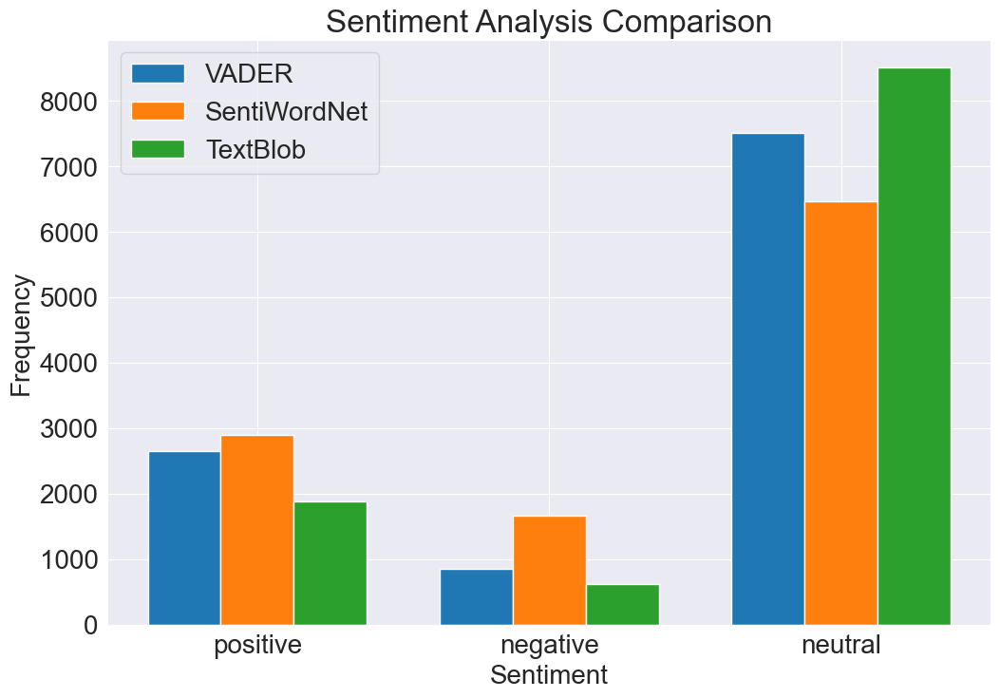

In [64]:
import matplotlib.pyplot as plt

# Function to categorize polarity values into positive, negative, or neutral
def categorize_polarity(polarity):
    if polarity > 0:
        return 'positive'
    elif polarity < 0:
        return 'negative'
    else:
        return 'neutral'

# Initialize lists to store categorized polarity values for each method
vader_polarities = {'positive': 0, 'negative': 0, 'neutral': 0}
sentiwordnet_polarities = {'positive': 0, 'negative': 0, 'neutral': 0}
textblob_polarities = {'positive': 0, 'negative': 0, 'neutral': 0}

# Loop through each message and update polarity counts
for message in df['message']:
    vader_sentiment = analyze_sentiment_vader(message)
    sentiwordnet_sentiment = analyze_sentiment_sentiwordnet(message)
    textblob_sentiment = analyze_sentiment_textblob(message)
    
    vader_polarity = vader_sentiment['compound']
    sentiwordnet_polarity = (sentiwordnet_sentiment['pos'] - sentiwordnet_sentiment['neg'])
    textblob_polarity = textblob_sentiment['polarity']
    
    vader_polarities[categorize_polarity(vader_polarity)] += 1
    sentiwordnet_polarities[categorize_polarity(sentiwordnet_polarity)] += 1
    textblob_polarities[categorize_polarity(textblob_polarity)] += 1

# Plotting
categories = ['positive', 'negative', 'neutral']
vader_counts = [vader_polarities[cat] for cat in categories]
sentiwordnet_counts = [sentiwordnet_polarities[cat] for cat in categories]
textblob_counts = [textblob_polarities[cat] for cat in categories]

bar_width = 0.25
index = range(len(categories))

plt.bar(index, vader_counts, bar_width, label='VADER')
plt.bar([i + bar_width for i in index], sentiwordnet_counts, bar_width, label='SentiWordNet')
plt.bar([i + 2*bar_width for i in index], textblob_counts, bar_width, label='TextBlob')

plt.xlabel('Sentiment')
plt.ylabel('Frequency')
plt.title('Sentiment Analysis Comparison')
plt.xticks([i + bar_width for i in index], categories)
plt.legend()
plt.show()


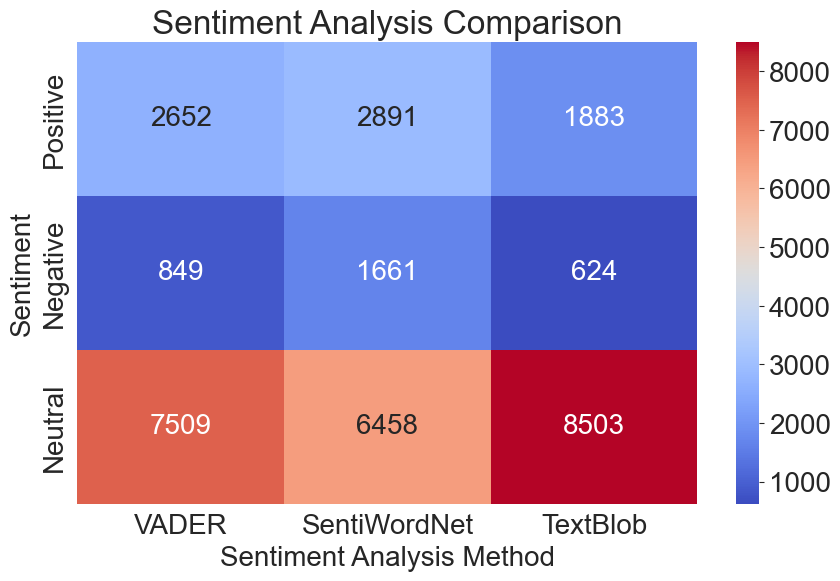

In [65]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a DataFrame containing the frequencies of sentiment classifications
data = {
    'Sentiment': ['Positive', 'Negative', 'Neutral'],
    'VADER': vader_counts,
    'SentiWordNet': sentiwordnet_counts,
    'TextBlob': textblob_counts
}
df_heatmap = pd.DataFrame(data)

# Set 'Sentiment' column as the index
df_heatmap.set_index('Sentiment', inplace=True)

# Plotting heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df_heatmap, annot=True, cmap='coolwarm', fmt='g')
plt.title('Sentiment Analysis Comparison')
plt.xlabel('Sentiment Analysis Method')
plt.ylabel('Sentiment')
plt.show()


VADER Polarity: 0.07002269754768403
SentiWordNet Polarity: 0.030841871026339687
TextBlob Polarity: 0.053023395898065095


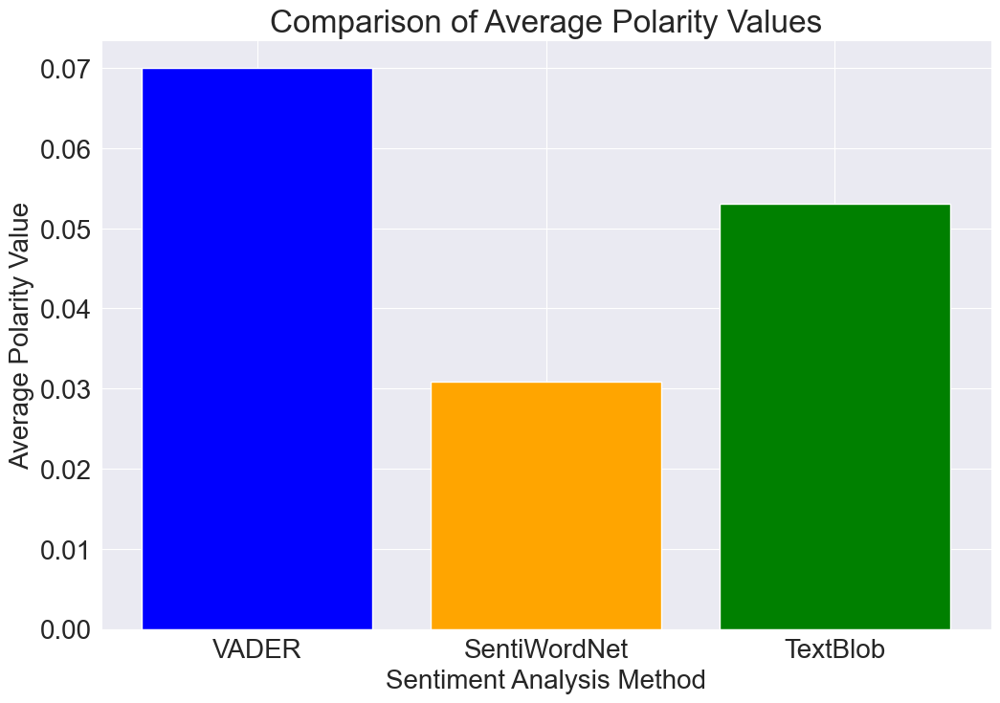

In [66]:
# Calculate polarity values
vader_polarity = average_vader_sentiment.get('compound', 0.0)
sentiwordnet_polarity = (average_sentiwordnet_sentiment.get('pos', 0.0) - average_sentiwordnet_sentiment.get('neg', 0.0)) / 2.0
textblob_polarity = average_textblob_sentiment.get('polarity', 0.0)

# Print the calculated polarity values
print("VADER Polarity:", vader_polarity)
print("SentiWordNet Polarity:", sentiwordnet_polarity)
print("TextBlob Polarity:", textblob_polarity)

# Plotting
import matplotlib.pyplot as plt

methods = ['VADER', 'SentiWordNet', 'TextBlob']
polarity_values = [vader_polarity, sentiwordnet_polarity, textblob_polarity]
plt.bar(methods, polarity_values, color=['blue', 'orange', 'green'])
plt.xlabel('Sentiment Analysis Method')
plt.ylabel('Average Polarity Value')
plt.title('Comparison of Average Polarity Values')
plt.show()


# 18. TRANSLATING FIRST 30 MESSAGES ACCORDING TO OUR CHOICE

In [67]:
pip install googletrans==4.0.0-rc1

Note: you may need to restart the kernel to use updated packages.


In [68]:
from googletrans import LANGUAGES

# Print the list of supported languages and their language codes
for lang_code, lang_name in LANGUAGES.items():
    print(f"{lang_code}: {lang_name}")

af: afrikaans
sq: albanian
am: amharic
ar: arabic
hy: armenian
az: azerbaijani
eu: basque
be: belarusian
bn: bengali
bs: bosnian
bg: bulgarian
ca: catalan
ceb: cebuano
ny: chichewa
zh-cn: chinese (simplified)
zh-tw: chinese (traditional)
co: corsican
hr: croatian
cs: czech
da: danish
nl: dutch
en: english
eo: esperanto
et: estonian
tl: filipino
fi: finnish
fr: french
fy: frisian
gl: galician
ka: georgian
de: german
el: greek
gu: gujarati
ht: haitian creole
ha: hausa
haw: hawaiian
iw: hebrew
he: hebrew
hi: hindi
hmn: hmong
hu: hungarian
is: icelandic
ig: igbo
id: indonesian
ga: irish
it: italian
ja: japanese
jw: javanese
kn: kannada
kk: kazakh
km: khmer
ko: korean
ku: kurdish (kurmanji)
ky: kyrgyz
lo: lao
la: latin
lv: latvian
lt: lithuanian
lb: luxembourgish
mk: macedonian
mg: malagasy
ms: malay
ml: malayalam
mt: maltese
mi: maori
mr: marathi
mn: mongolian
my: myanmar (burmese)
ne: nepali
no: norwegian
or: odia
ps: pashto
fa: persian
pl: polish
pt: portuguese
pa: punjabi
ro: romanian
r

In [69]:
 import pandas as pd
from googletrans import Translator

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages to be translated

# Function to translate messages from one language to another
def translate_messages(messages, source_lang, target_lang):
    translator = Translator()
    translated_messages = []
    for message in messages:
        translation = translator.translate(message, src=source_lang, dest=target_lang)
        translated_messages.append(translation.text)
    return translated_messages

# Set the source and target languages for translation
source_lang = 'en'  # Assuming English is the source language
target_lang = 'ja'  # Assuming japanese is the target language

# Select the first 30 messages
first_50_messages = df['message'].head(56)

# Translate the first 30 messages
translated_messages = translate_messages(first_50_messages, source_lang, target_lang)

# Create a DataFrame to store the original and translated messages
translated_df = pd.DataFrame({'original_message': first_50_messages, 'translated_message': translated_messages})

# Display the DataFrame with translated messages
print(translated_df)


                                     original_message  \
0   Messages and calls are end-to-end encrypted. N...   
1         Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻"    
2          You joined using this group's invite link    
3   +91 99871 38558 joined using this group's invi...   
4   +91 91680 38866 joined using this group's invi...   
5   +91 72762 35231 joined using this group's invi...   
6   +91 88392 06534 joined using this group's invi...   
7   +91 98709 38217 joined using this group's invi...   
8   +91 98702 02065 joined using this group's invi...   
9   +91 91370 44426 joined using this group's invi...   
10  +91 86559 19035 joined using this group's invi...   
11  +91 79778 39093 joined using this group's invi...   
12  +91 98670 44401 joined using this group's invi...   
13  +91 84828 26061 joined using this group's invi...   
14  +91 96191 55044 joined using this group's invi...   
15  +91 99201 75875 joined using this group's invi...   
16  +91 87799 77656 joined usin

In [70]:
source_lang = 'en'  # Assuming English is the source language
target_lang = 'hi'  # Assuming hindi is the target language

# Select the first 30 messages
first_50_messages = df['message'].head(56)

# Translate the first 30 messages
translated_messages = translate_messages(first_50_messages, source_lang, target_lang)

# Create a DataFrame to store the original and translated messages
translated_df = pd.DataFrame({'original_message': first_50_messages, 'translated_message': translated_messages})

# Display the DataFrame with translated messages
print(translated_df)

                                     original_message  \
0   Messages and calls are end-to-end encrypted. N...   
1         Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻"    
2          You joined using this group's invite link    
3   +91 99871 38558 joined using this group's invi...   
4   +91 91680 38866 joined using this group's invi...   
5   +91 72762 35231 joined using this group's invi...   
6   +91 88392 06534 joined using this group's invi...   
7   +91 98709 38217 joined using this group's invi...   
8   +91 98702 02065 joined using this group's invi...   
9   +91 91370 44426 joined using this group's invi...   
10  +91 86559 19035 joined using this group's invi...   
11  +91 79778 39093 joined using this group's invi...   
12  +91 98670 44401 joined using this group's invi...   
13  +91 84828 26061 joined using this group's invi...   
14  +91 96191 55044 joined using this group's invi...   
15  +91 99201 75875 joined using this group's invi...   
16  +91 87799 77656 joined usin

# 19. Networks

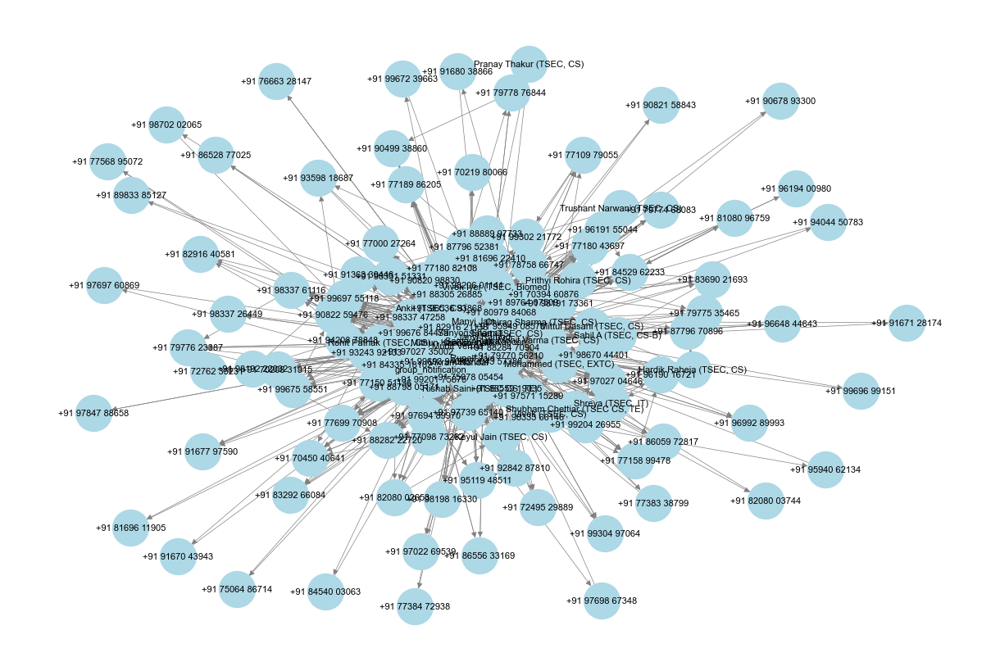

In [71]:
import networkx as nx

# Create an empty directed graph
contact_network = nx.DiGraph()

# Add edges based on interactions between users
for i in range(1, len(df)):
    sender = df.loc[i-1, 'user']
    receiver = df.loc[i, 'user']
    if sender != receiver:  # Exclude self-interactions
        if contact_network.has_edge(sender, receiver):
            # Increment edge weight if the edge already exists
            contact_network[sender][receiver]['weight'] += 1
        else:
            # Add a new edge with weight 1 if it doesn't exist
            contact_network.add_edge(sender, receiver, weight=1)

# Plot the contact network
nx.draw(contact_network, with_labels=True, node_color='lightblue', font_size=8, node_size=1000, edge_color='gray', width=0.5)

# Display the plot
plt.show()

In [72]:
import networkx as nx
import community

# Assuming your directed graph is named 'contact_network'
undirected_contact_network = contact_network.to_undirected()

# Detect communities using the Louvain algorithm
communities = community.best_partition(undirected_contact_network)

# Print the detected communities
print("Detected communities:")
for user, community_id in communities.items():
    print(f"User: {user}, Community: {community_id}")


Detected communities:
User: group_notification, Community: 0
User: +91 96536 93868, Community: 0
User: Janvi Rathod, Community: 1
User: +91 99201 75875, Community: 2
User: +91 95949 08570, Community: 0
User: +91 79778 76844, Community: 0
User: +91 90499 38860, Community: 0
User: Samay Raina, Community: 1
User: Saket (TSEC, CS), Community: 0
User: +91 77568 95072, Community: 0
User: Rohit Pathak (TSEC, CS), Community: 0
User: +91 75078 05454, Community: 3
User: Anjali Kapoor, Community: 1
User: +91 79774 68083, Community: 4
User: +91 70394 60876, Community: 4
User: +91 96191 55044, Community: 4
User: +91 90678 93300, Community: 4
User: Mohit Varma (TSEC, CS), Community: 4
User: +91 79770 56210, Community: 0
User: Chirag Sharma (TSEC, CS), Community: 0
User: Vivek Iyer (TSEC, Biomed), Community: 4
User: Manvi Jain, Community: 0
User: +91 81696 22410, Community: 3
User: +91 89764 07509, Community: 4
User: +91 78758 66747, Community: 0
User: Ankit (TSEC, CS), Community: 4
User: +91 86556 3

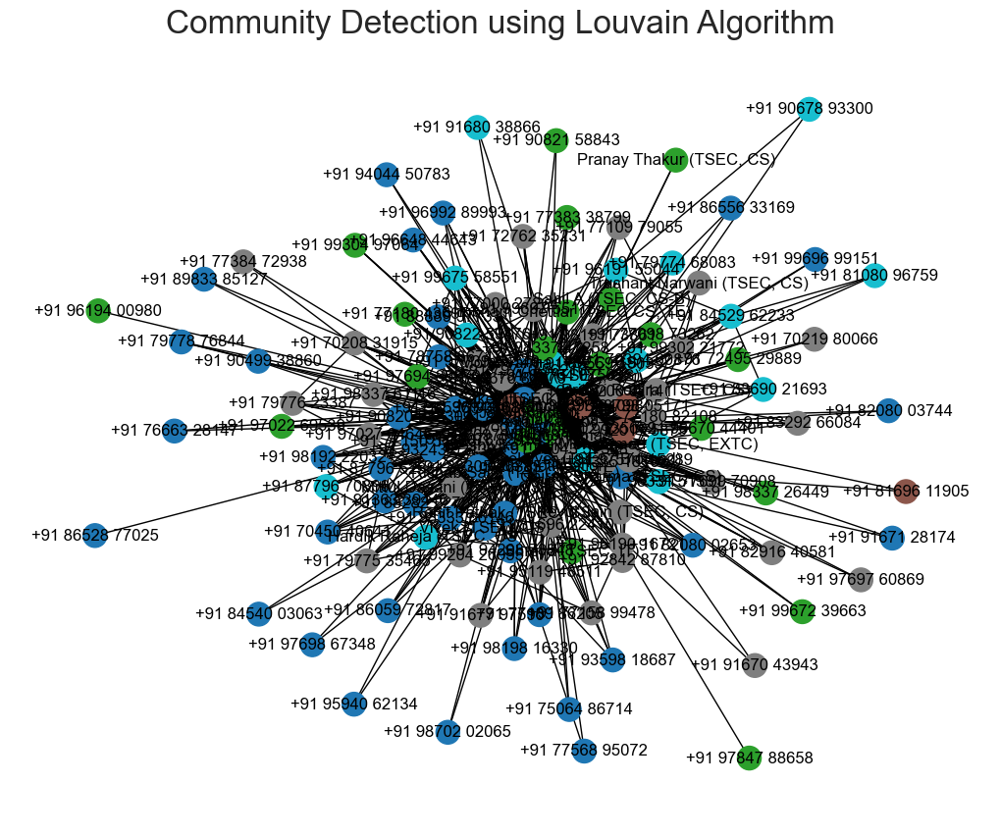

In [73]:
import matplotlib.pyplot as plt

# Create a layout for the nodes
layout = nx.spring_layout(undirected_contact_network)

# Create a list of colors for each node based on its community
colors = [communities[node] for node in undirected_contact_network.nodes()]

# Draw the graph with nodes colored by community
plt.figure(figsize=(10, 8))
nx.draw(undirected_contact_network, pos=layout, node_color=colors, with_labels=True, cmap=plt.cm.tab10)
plt.title('Community Detection using Louvain Algorithm')
plt.show()


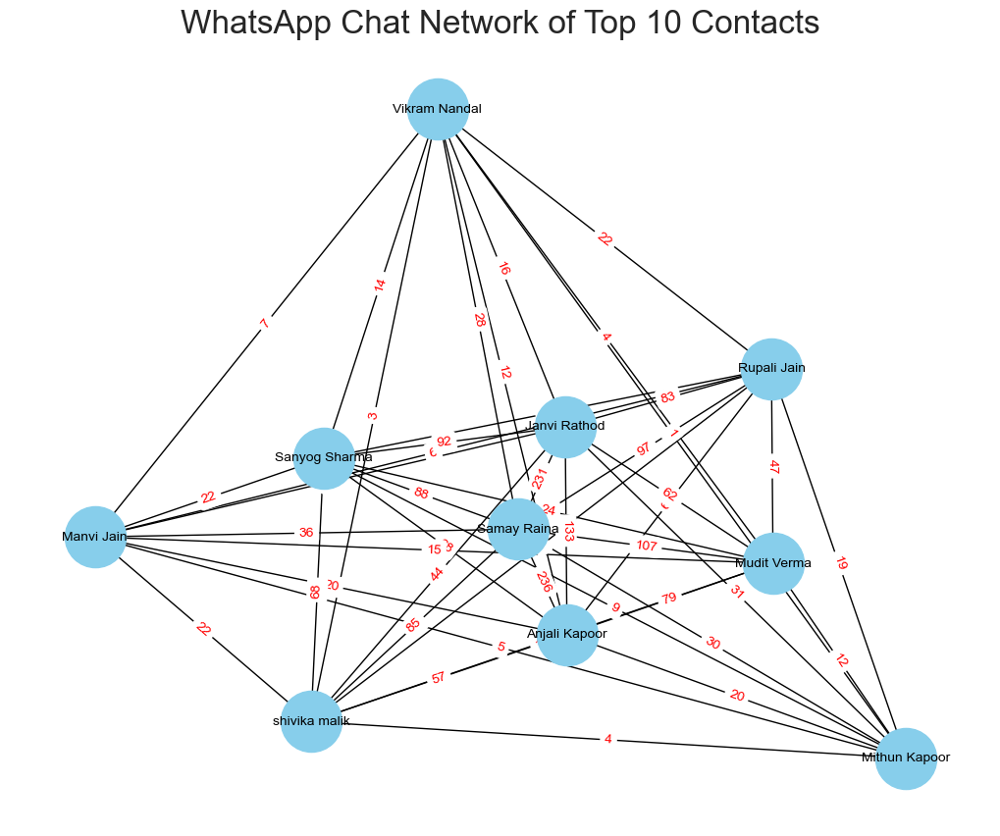

In [74]:
import networkx as nx
import matplotlib.pyplot as plt

# Extract the top 10 contacts from the top10df DataFrame
top_contacts = top10df['user'].tolist()[:10]

# Filter the original contact network to include only the top 10 contacts
top_contact_network = undirected_contact_network.subgraph(top_contacts)

# Create a layout for the nodes
layout = nx.spring_layout(top_contact_network)

# Draw the graph
plt.figure(figsize=(10, 8))
nx.draw(top_contact_network, pos=layout, with_labels=True, node_size=2000, node_color='skyblue', font_size=10, font_color='black')

# Draw edge labels (weights)
edge_labels = nx.get_edge_attributes(top_contact_network, 'weight')
nx.draw_networkx_edge_labels(top_contact_network, pos=layout, edge_labels=edge_labels, font_size=10, font_color='red')

plt.title('WhatsApp Chat Network of Top 10 Contacts')
plt.show()

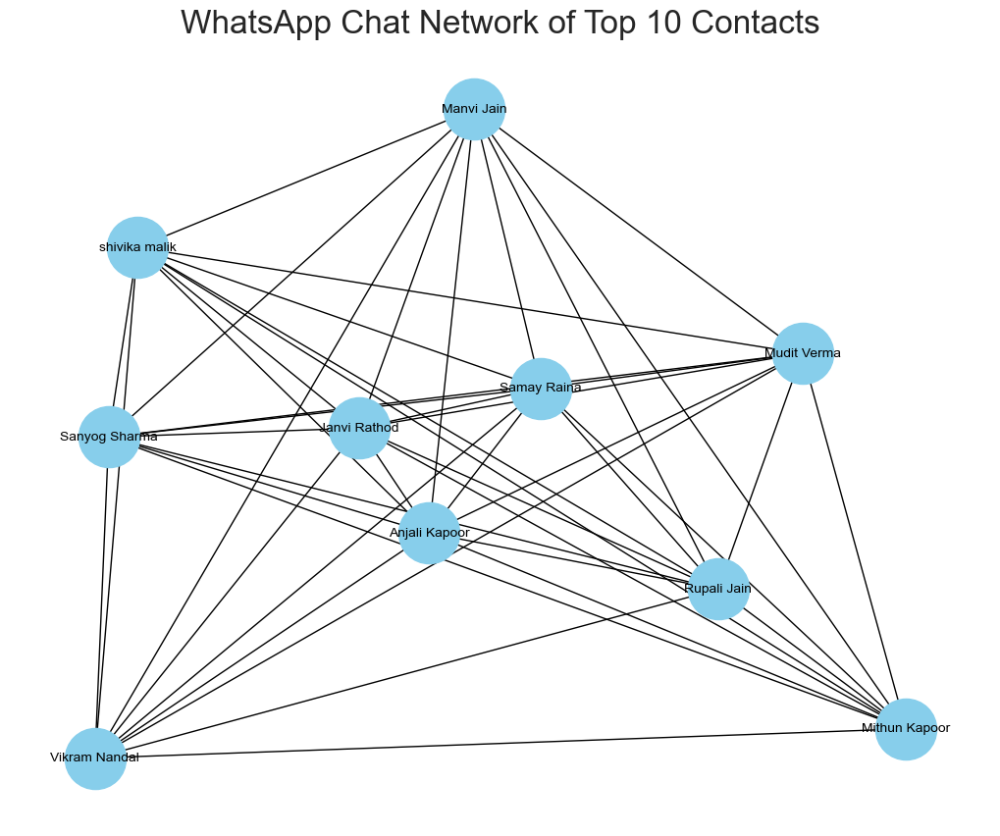

In [75]:
import networkx as nx

# Extract the top 10 contacts from the top10df DataFrame
top_contacts = top10df['user'].tolist()[:10]

# Filter the original contact network to include only the top 10 contacts
top_contact_network = undirected_contact_network.subgraph(top_contacts)

# Create a layout for the nodes
layout = nx.spring_layout(top_contact_network)

# Draw the graph
plt.figure(figsize=(10, 8))
nx.draw(top_contact_network, pos=layout, with_labels=True, node_size=2000, node_color='skyblue', font_size=10, font_color='black')
plt.title('WhatsApp Chat Network of Top 10 Contacts')
plt.show()


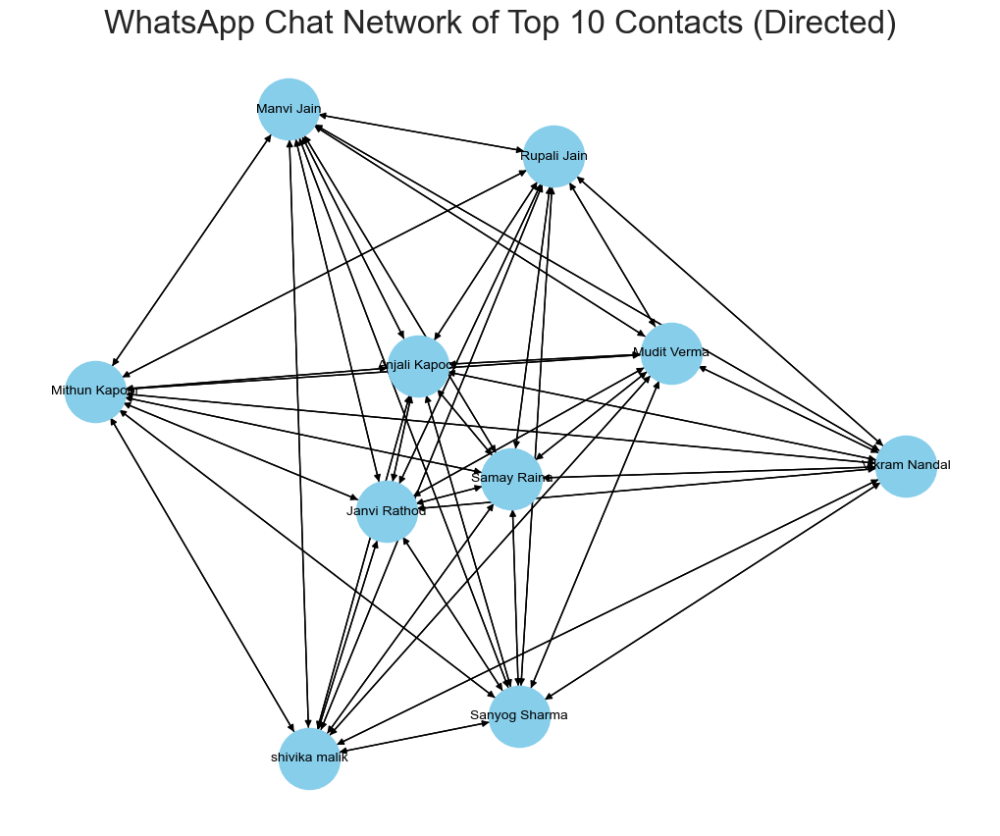

In [76]:
import networkx as nx

# Assuming you have an undirected contact network named undirected_contact_network
# Convert the undirected contact network to a directed graph
directed_contact_network = undirected_contact_network.to_directed()

# Extract the top 10 contacts from the top10df DataFrame
top_contacts = top10df['user'].tolist()[:10]

# Filter the original contact network to include only the top 10 contacts
top_contact_network = directed_contact_network.subgraph(top_contacts)

# Create a layout for the nodes
layout = nx.spring_layout(top_contact_network)

# Draw the graph
plt.figure(figsize=(10, 8))
nx.draw(top_contact_network, pos=layout, with_labels=True, node_size=2000, node_color='skyblue', font_size=10, font_color='black', arrows=True)
plt.title('WhatsApp Chat Network of Top 10 Contacts (Directed)')
plt.show()
